<a href="https://colab.research.google.com/github/arkincognito/codestates_section_projects/blob/main/section2_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Google Colab을 사용하는 경우 해당 셀을 실행하세요
import sys

if 'google.colab' in sys.modules:
    # Install packages in Colab
    !pip install category_encoders==2.*
    !pip install eli5
    !pip install pandas-profiling==2.*
    !pip install folium
    !pip install pdpbox
    !pip install shap
    !pip install optuna
    !pip install xgboost
    !pip install pystan==2.19.1.1
    !pip install fbprophet
    !pip install pysolar
    

     |████████████████████████████████| 81kB 1.2MB/s 
     |████████████████████████████████| 112kB 5.3MB/s 
     |████████████████████████████████| 245kB 6.1MB/s 
     |████████████████████████████████| 81kB 7.2MB/s 
     |████████████████████████████████| 61kB 6.0MB/s 
     |████████████████████████████████| 81kB 7.5MB/s 
     |████████████████████████████████| 1.1MB 48.3MB/s 
     |████████████████████████████████| 3.2MB 45.9MB/s 
     |████████████████████████████████| 296kB 52.3MB/s 
  Created wheel for phik: filename=phik-0.11.2-cp37-none-any.whl size=1107413 sha256=b98f79f1f06f0ee5f458a3d07b0ea963cf739d6f8d27f0659525d00f27f44431
  Stored in directory: /root/.cache/pip/wheels/c0/a3/b0/f27b1cfe32ea131a3715169132ff6d85653789e80e966c3bf6
  Created wheel for htmlmin: filename=htmlmin-0.1.12-cp37-none-any.whl size=27085 sha256=eb732bc51553853aa2bd1c01423ac99180edcbbe01adbae190a9128dad45c5cc
  Stored in directory: /root/.cache/pip/wheels/43/07/ac/7c5a9d708d65247ac1f94066cf1db075540b857

     |████████████████████████████████| 34.0MB 177kB/s 
     |████████████████████████████████| 13.1MB 46.9MB/s 
  Created wheel for pdpbox: filename=PDPbox-0.2.1-cp37-none-any.whl size=35758228 sha256=199ae02e5d722596fbdfb835cae6bd8c5933d252b3e9a751d43a4b824598cad8
  Stored in directory: /root/.cache/pip/wheels/c8/13/11/ecac74c6192790c94f6f5d919f1a388f927b9febb690e45eef
Successfully built pdpbox
ERROR: phik 0.11.2 has requirement scipy>=1.5.2, but you'll have scipy 1.4.1 which is incompatible.
ERROR: pandas-profiling 2.11.0 has requirement matplotlib>=3.2.0, but you'll have matplotlib 3.1.1 which is incompatible.
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: matplotlib 3.2.2
    Uninstalling matplotlib-3.2.2:
      Successfully uninstalled matplotlib-3.2.2


     |████████████████████████████████| 358kB 5.8MB/s 
  Created wheel for shap: filename=shap-0.39.0-cp37-cp37m-linux_x86_64.whl size=491621 sha256=7d677b1c4d92eafd3f0df9e8b5ad78886bff4217e5bb396b4ea8330809266d6b
  Stored in directory: /root/.cache/pip/wheels/15/27/f5/a8ab9da52fd159aae6477b5ede6eaaec69fd130fa0fa59f283
Successfully built shap
     |████████████████████████████████| 296kB 6.5MB/s 
     |████████████████████████████████| 163kB 7.9MB/s 
     |████████████████████████████████| 81kB 4.5MB/s 
     |████████████████████████████████| 81kB 4.8MB/s 
     |████████████████████████████████| 143kB 8.6MB/s 
     |████████████████████████████████| 112kB 10.1MB/s 
     |████████████████████████████████| 51kB 3.8MB/s 
  Created wheel for pyperclip: filename=pyperclip-1.8.2-cp37-none-any.whl size=11107 sha256=6b9411dd61cf6faf08e125e4c6ae1f51050d8bb5183a9a8198ae59654717d92c
  Stored in directory: /root/.cache/pip/wheels/25/af/b8/3407109267803f4015e1ee2ff23be0c8c19ce4008665931ee1
Successf

In [2]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
from IPython.display import set_matplotlib_formats
mpl.rcParams['axes.unicode_minus'] = False
set_matplotlib_formats('retina')

import numpy as np
import pandas as pd

# Adjust maximum display row count, column count, and column width
pd.set_option("display.max_rows", 999)
pd.set_option("display.max_columns", 999)
pd.set_option("display.max_colwidth", 9999)

# Adjust default float display to .3f
pd.set_option("precision", 4)
import seaborn as sns
%matplotlib inline

## Avoid scroll-in-the-scroll in the entire Notebook on Google Colab
## https://stackoverflow.com/questions/55546869/google-colaboratory-is-there-any-way-to-expand-the-height-of-the-result-cell-of
from IPython.display import Javascript
def resize_colab_cell():
    display(Javascript('google.colab.output.setIframeHeight(0, true, {maxHeight: 5000})'))
get_ipython().events.register('pre_run_cell', resize_colab_cell)

In [3]:
COLOR_FACECOLOR = "#454545"
COLOR_FONT = "white"
COLOR_PROPS = "white"
def set_rcDefault():
    for key in ["axes.facecolor", "figure.facecolor", "legend.facecolor", "savefig.facecolor"]:
        plt.rcParams[key] = COLOR_FACECOLOR

    plt.rcParams['text.color'] = COLOR_FONT
    plt.rcParams['axes.titlecolor'] = COLOR_FONT
    plt.rcParams['axes.labelcolor'] = COLOR_FONT
    plt.rcParams['xtick.color'] = COLOR_FONT
    plt.rcParams['ytick.color'] = COLOR_FONT
    # This doesn't work for regplot
    # plt.rcParams['scatter.edgecolors'] = COLOR_PROPS

    # ATM, these two props color settings won't work with sns.boxplot.
    for key in plt.rcParams.keys():
        if "props.markerfacecolor" in key or "props.markeredgecolor" in key:
            plt.rcParams[key] = COLOR_PROPS

    # Properties for quantile markers and outlier(flier) markers in boxplot
    for key in ['boxplot.capprops.color',  'boxplot.meanprops.color', 'boxplot.medianprops.color', 'boxplot.whiskerprops.color', 'boxplot.flierprops.color']:
        plt.rcParams[key] = COLOR_PROPS

    # Set title sizes for axes and figure
    for key in plt.rcParams.keys():
        if "titlesize" in key:
            plt.rcParams[key] = "xx-large"

    plt.rcParams['legend.fontsize'] = "large"
    plt.rcParams['legend.title_fontsize'] = "large"
    plt.rcParams["axes.labelsize"] = "large"

    plt.rcParams['axes.titlepad'] = 6.0
    for key in plt.rcParams.keys():
        if "weight" in key:
            plt.rcParams[key] = 'bold'

    ## This section is used for kwargs in seaborn plots.
    # use for boxplot props
PROPS_BOXPLOT = {
    "flierprops" : dict(markerfacecolor=COLOR_PROPS),
    "whiskerprops" : dict(color=COLOR_PROPS),
    "capprops" : dict(color=COLOR_PROPS),
    "meanprops" : dict(color=COLOR_PROPS),
    "medianprops" : dict(color=COLOR_PROPS)
}
# use for regplot line_kws and scatter_kws
line_kws={"color":COLOR_PROPS}
scatter_kws={"alpha":0.5, "edgecolor":COLOR_PROPS, "linewidth":0.1}
set_rcDefault()
# sns.set_style('whitegrid') globally change sns style.style must be one of white, dark, whitegrid, darkgrid, ticks
# HOWEVER, sns.set_theme() takes in default args such as font and style, and change them to default setting.
# So sns.set_theme(), should be used before font setting.
# Otherwise, use with sns.axes_style()
# sns.set(rc={'figure.facecolor':'k'})


<IPython.core.display.Javascript object>

# Data Description
[DACON 동서발전 태양광 발전량 예측 AI 경진대회](https://dacon.io/competitions/official/235720/codeshare/2488?page=1&dtype=recent)에서 볼 수 있습니다.<br>
## site_info.csv - 발전소 정보
* Id : 사이트 식별자
* Capacity : 발전소 발전용량(MW)
* Address : 주소
* InstallationAngle : 설치각(º)
* IncidentAngle : 입사각(º)
* Latitude : 위도
* Longitude : 경도


## energy.csv - 발전소별 발전량
* time : 1시간 단위 계량된 시간 (ex-2018-03-01 1:00:00 => 2018-03-01 00:00:00 ~ 2018-03-01 1:00:00 1시간동안 발전량 계량)
* dangjin_floating : 당진수상태양광 발전량(KW)
* dangjin_warehouse : 당진자재창고태양광 발전량(KW)
* dangjin : 당진태양광 발전량(KW)
* ulsan : 울산태양광 발전량(KW)


##ulsan_fcst_data.csv - 울산지역 발전소 동네 예보
* Forecast time : 예보 발표 시점
* forecast : 예보 시간 (ex - Forecast time:2018-03-01 11:00:00, forecast:4.0 => 2018-03-01 11:00:00에 발표한 2018-03-01 15:00:00 예보
* 예보 발표 시점 'forecast'시간 후 기상 예보
* Temperature : 온도(℃)
* Humidity : 습도(%)
* WindSpeed : 풍속(m/s)
* WindDirection : 풍향(º)
* Cloud : 하늘상태(1-맑음, 2-구름보통, 3-구름많음, 4-흐림)<br>
출처 : 기상청 동네예보(https://data.kma.go.kr/data/rmt/rmtList.do?code=420&pgmNo=572)<br>
※ 기상청 동네예보는 1개월 단위로 배포 되며 실시간 정보는 '공공데이터포털'의 '동네예보 조회서비스' API를 통해 확인 가능


##ulsan_obs_data.csv - 울산지역 발전소 인근 기상 관측 자료
* 지점 : 지점 코드
* 지점명 : 관측소 지점
* 일시 : 관측 시간
* 기온(°C) : 기온(°C)
* 풍속(m/s) : 풍속(m/s)
* 풍향(16방위) : 풍향(º)
* 습도(%) : 습도(%)
* 전운량(10분위) : 전운량(낮을 수록 구름이 적음)<br>
출처 : 기상청 기상관측(https://data.kma.go.kr/data/grnd/selectAsosRltmList.do?pgmNo=36)

In [4]:
# df_fcst = pd.read_csv("/content/ulsan_fcst_data.csv")
df_obs = pd.read_csv("/content/ulsan_obs_data.csv")
df_energy = pd.read_csv("/content/energy.csv")

mapping_cols_obs = {"지점": "StationId", "지점명": "StationName", "일시": "DateTime", "기온(°C)" : "Temperature", "풍속(m/s)": "WindSpeed",
                    "풍향(16방위)" : "WindDirection", "습도(%)" : "Humidity", "전운량(10분위)" : "Cloud"}
df_obs.rename(columns = mapping_cols_obs, inplace = True)
# mapping_cols_fcst = {"Forecast time":"DateTime", "forecast": "TimeDelta"}
# df_fcst.rename(columns = mapping_cols_fcst, inplace = True)
mapping_cols_energy = {"time": "DateTime", "dangjin_floating": "DangjinFloating", "dangjin_warehouse" : "DangjinWarehouse", "dangjin":"Dangjin", "ulsan": "Ulsan"}
df_energy.rename(columns = mapping_cols_energy, inplace = True)
df_obs

<IPython.core.display.Javascript object>

,StationId,StationName,DateTime,Temperature,WindSpeed,WindDirection,Humidity,Cloud
0,152,울산,2018-03-01 00:00,8.2,3.9,340.0,98.0,10.0
1,152,울산,2018-03-01 01:00,7.0,4.1,320.0,97.0,10.0
2,152,울산,2018-03-01 02:00,6.5,5.9,290.0,80.0,NaN
3,152,울산,2018-03-01 03:00,6.2,4.6,320.0,79.0,3.0
4,152,울산,2018-03-01 04:00,6.7,4.5,320.0,73.0,1.0
...,...,...,...,...,...,...,...,...
25627,152,울산,2021-01-31 19:00,8.8,2.5,200.0,50.0,5.0
25628,152,울산,2021-01-31 20:00,8.7,3.9,200.0,49.0,1.0
25629,152,울산,2021-01-31 21:00,8.4,2.4,230.0,51.0,7.0
25630,152,울산,2021-01-31 22:00,9.4,3.3,230.0,51.0,8.0


	지점	지점명	일시	기온(°C)	풍속(m/s)	풍향(16방위)	습도(%)	전운량(10분위)

In [5]:
# df_fcst.head(100)

<IPython.core.display.Javascript object>

In [6]:
df_energy

<IPython.core.display.Javascript object>

,DateTime,DangjinFloating,DangjinWarehouse,Dangjin,Ulsan
0,2018-03-01 1:00:00,0.0,0.0,0,0
1,2018-03-01 2:00:00,0.0,0.0,0,0
2,2018-03-01 3:00:00,0.0,0.0,0,0
3,2018-03-01 4:00:00,0.0,0.0,0,0
4,2018-03-01 5:00:00,0.0,0.0,0,0
...,...,...,...,...,...
25627,2021-01-31 20:00:00,0.0,0.0,0,0
25628,2021-01-31 21:00:00,0.0,0.0,0,0
25629,2021-01-31 22:00:00,0.0,0.0,0,0
25630,2021-01-31 23:00:00,0.0,0.0,0,0


In [7]:
df_energy.info()

<IPython.core.display.Javascript object>

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25632 entries, 0 to 25631
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   DateTime          25632 non-null  object 
 1   DangjinFloating   25608 non-null  float64
 2   DangjinWarehouse  25584 non-null  float64
 3   Dangjin           25632 non-null  int64  
 4   Ulsan             25632 non-null  int64  
dtypes: float64(2), int64(2), object(1)
memory usage: 1001.4+ KB


In [8]:
from datetime import timedelta
# energy의 시간은 ISO8601을 따르지 않고 00:00:01 ~ 24:00:00 으로 표기되어 00:00:00 ~ 23:59:59 로 표기되는 python datetime 과 호환되지 않습니다.
# 24:00:00 인 경우 00:00:00으로 바꾸고 datetime object로 변환한 뒤, 하루를 더해주도록 하겠습니다.
# 모든 시간대는 서울 시간대로 timezone 설정해 pysolar 에 호환되도록 하고 후에 추가할 일출일몰 시간과 합치기 용이하도록 만들겠습니다.
# 최종적으로 Prophet에 투입할 때는 timezone을 제거하고 사용해야합니다.
def parse_time_energy(df):
    df_ = df.copy()
    df_["DateTime"] = df_["DateTime"].str.replace(r'[\s]+(\d\:\d\d\:\d\d)$', r' 0\1')
    df_["dayPlus"] = df_["DateTime"].str.contains(f"24:00:00$")
    df_.loc[df_["dayPlus"], "DateTime"] = df_.loc[df_["dayPlus"], "DateTime"].transform(lambda x: x[:-8]+"00:00:00")
    df_["DateTime"] = pd.to_datetime(df_["DateTime"], format="%Y-%m-%d %H:%M:%S")
    df_["DateTime"] = df_["DateTime"].dt.tz_localize("Asia/Seoul")
    df_.loc[df_["dayPlus"], "DateTime"] = df_.loc[df_["dayPlus"], "DateTime"] + timedelta(days=1)
    df_.drop(columns="dayPlus", inplace=True)
    return df_

df_energy = parse_time_energy(df_energy)

df_obs["DateTime"] = pd.to_datetime(df_obs["DateTime"], format="%Y-%m-%d %H:%M")
df_obs["DateTime"] = df_obs["DateTime"].dt.tz_localize("Asia/Seoul")

<IPython.core.display.Javascript object>

In [9]:
df_energy

<IPython.core.display.Javascript object>

,DateTime,DangjinFloating,DangjinWarehouse,Dangjin,Ulsan
0,2018-03-01 01:00:00+09:00,0.0,0.0,0,0
1,2018-03-01 02:00:00+09:00,0.0,0.0,0,0
2,2018-03-01 03:00:00+09:00,0.0,0.0,0,0
3,2018-03-01 04:00:00+09:00,0.0,0.0,0,0
4,2018-03-01 05:00:00+09:00,0.0,0.0,0,0
...,...,...,...,...,...
25627,2021-01-31 20:00:00+09:00,0.0,0.0,0,0
25628,2021-01-31 21:00:00+09:00,0.0,0.0,0,0
25629,2021-01-31 22:00:00+09:00,0.0,0.0,0,0
25630,2021-01-31 23:00:00+09:00,0.0,0.0,0,0


In [10]:
df_energy.info(), df_obs.info()

<IPython.core.display.Javascript object>

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25632 entries, 0 to 25631
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype                     
---  ------            --------------  -----                     
 0   DateTime          25632 non-null  datetime64[ns, Asia/Seoul]
 1   DangjinFloating   25608 non-null  float64                   
 2   DangjinWarehouse  25584 non-null  float64                   
 3   Dangjin           25632 non-null  int64                     
 4   Ulsan             25632 non-null  int64                     
dtypes: datetime64[ns, Asia/Seoul](1), float64(2), int64(2)
memory usage: 1001.4 KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25632 entries, 0 to 25631
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype                     
---  ------         --------------  -----                     
 0   StationId      25632 non-null  int64                     
 1   StationName    25632 non-null  object       

(None, None)

In [11]:
df = pd.merge(df_energy, df_obs, on="DateTime")

<IPython.core.display.Javascript object>

In [12]:
df.head(30)

<IPython.core.display.Javascript object>

,DateTime,DangjinFloating,DangjinWarehouse,Dangjin,Ulsan,StationId,StationName,Temperature,WindSpeed,WindDirection,Humidity,Cloud
0,2018-03-01 01:00:00+09:00,0.0,0.0,0,0,152,울산,7.0,4.1,320.0,97.0,10.0
1,2018-03-01 02:00:00+09:00,0.0,0.0,0,0,152,울산,6.5,5.9,290.0,80.0,NaN
2,2018-03-01 03:00:00+09:00,0.0,0.0,0,0,152,울산,6.2,4.6,320.0,79.0,3.0
3,2018-03-01 04:00:00+09:00,0.0,0.0,0,0,152,울산,6.7,4.5,320.0,73.0,1.0
4,2018-03-01 05:00:00+09:00,0.0,0.0,0,0,152,울산,7.5,6.0,290.0,69.0,1.0
5,2018-03-01 06:00:00+09:00,0.0,0.0,0,0,152,울산,7.8,5.8,290.0,67.0,0.0
6,2018-03-01 07:00:00+09:00,0.0,0.0,0,0,152,울산,7.9,3.7,290.0,68.0,0.0
7,2018-03-01 08:00:00+09:00,0.0,0.0,0,4,152,울산,8.9,2.8,230.0,64.0,7.0
8,2018-03-01 09:00:00+09:00,36.0,33.0,37,35,152,울산,9.7,5.0,250.0,61.0,9.0
9,2018-03-01 10:00:00+09:00,313.0,209.0,318,71,152,울산,9.6,4.4,290.0,64.0,8.0


In [13]:
df_ulsan = df[["DateTime", "Ulsan", "Temperature", "Humidity", "Cloud", "WindDirection", "WindSpeed"]].copy()
df_ulsan

<IPython.core.display.Javascript object>

,DateTime,Ulsan,Temperature,Humidity,Cloud,WindDirection,WindSpeed
0,2018-03-01 01:00:00+09:00,0,7.0,97.0,10.0,320.0,4.1
1,2018-03-01 02:00:00+09:00,0,6.5,80.0,NaN,290.0,5.9
2,2018-03-01 03:00:00+09:00,0,6.2,79.0,3.0,320.0,4.6
3,2018-03-01 04:00:00+09:00,0,6.7,73.0,1.0,320.0,4.5
4,2018-03-01 05:00:00+09:00,0,7.5,69.0,1.0,290.0,6.0
...,...,...,...,...,...,...,...
25626,2021-01-31 19:00:00+09:00,0,8.8,50.0,5.0,200.0,2.5
25627,2021-01-31 20:00:00+09:00,0,8.7,49.0,1.0,200.0,3.9
25628,2021-01-31 21:00:00+09:00,0,8.4,51.0,7.0,230.0,2.4
25629,2021-01-31 22:00:00+09:00,0,9.4,51.0,8.0,230.0,3.3


# 발전소 정보
`site_info.csv`의 위도 경도 좌표로 발전소의 위치를 확인할 수 있습니다.<br>
`folium`을 사용해 울산태양광발전소의 위치를 확인해보겠습니다.

In [14]:
df_site_info = pd.read_csv("/content/site_info.csv")
index_ulsan_site_info = 3
index_dangjin_site_info = 2
df_site_info.head()

<IPython.core.display.Javascript object>

,Id,Capacity,Address,InstallationAngle,IncidentAngle,Latitude,Longitude
0,당진수상태양광,1.0,충남 당진시 석문면 교로길 30,30.0,30.0,37.0508,126.5103
1,당진자재창고태양광,0.7,충남 당진시 석문면 교로길 30,30.0,30.0,37.0508,126.5103
2,당진태양광,1.0,충남 당진시 석문면 교로길 30,30.0,30.0,37.0508,126.5103
3,울산태양광,0.5,울산광역시 남구 용잠로 623,20.0,20.0,35.4777,129.3808


In [15]:
import folium
from folium.plugins import MarkerCluster
center_lat = df_site_info.loc[3,"Latitude"]
center_lng = df_site_info.loc[3,"Longitude"]
folium_map = folium.Map(
    location=[center_lat, center_lng],
    zoom_start=14,
    tiles='OpenStreetMap', 
    width='80%', 
)

folium_map.add_child(folium.LatLngPopup())

marker_cluster = MarkerCluster().add_to(folium_map)

for i, row in df_site_info.iterrows():
    if i == 3:
        name = row.Id
        lat = row.Latitude
        lon = row.Longitude
        capacity = row.Capacity
        
        # HTML here in the pop up 
        popup = '<b>{}</b></br><i>capacity = {}</i>'.format(name, capacity)
        
        folium.Marker([lat, lon], popup=popup, tooltip=name).add_to(marker_cluster)

<IPython.core.display.Javascript object>

In [16]:
folium_map

<IPython.core.display.Javascript object>

울산태양광발전소는 울산화력발전소 부지에 있는 것으로 확인됩니다. 바닷가에 지어졌고 남쪽에 산이 없기 때문에 태양광을 차단할 수 있는 요인은 날씨 뿐일 것으로 생각됩니다.

# 일출 일몰 데이터 수집

[Sunrise Sunset](https://sunrise-sunset.org/api)에서 제공하는 api에서 울산과 당진의 경도 위도 정보를 바탕으로 데이터에 속한 일자의 일출과 일몰 시각을 수집하였습니다.<br>
Rest api를 이용해 `get`을 보내면 아래와 같은 json 파일로 돌아옵니다.
 ```json
 {
      "results":
      {
        "sunrise":"2015-05-21T05:05:35+00:00",
        "sunset":"2015-05-21T19:22:59+00:00",
        "solar_noon":"2015-05-21T12:14:17+00:00",
        "day_length":51444,
        "civil_twilight_begin":"2015-05-21T04:36:17+00:00",
        "civil_twilight_end":"2015-05-21T19:52:17+00:00",
        "nautical_twilight_begin":"2015-05-21T04:00:13+00:00",
        "nautical_twilight_end":"2015-05-21T20:28:21+00:00",
        "astronomical_twilight_begin":"2015-05-21T03:20:49+00:00",
        "astronomical_twilight_end":"2015-05-21T21:07:45+00:00"
      },
       "status":"OK"
}
```

이 중 `sunrise`와 `sunset` 데이터를 이용하였습니다.

## Rest API
`Sunrise Sunset`을 활용하기 위한 Rest API의 기본적인 코드는 [여기서](https://velog.io/@dmstj907/Python-REST-API-%EC%8B%A4%EC%8A%B5)가져왔습니다.

## Parsing JSON
가져온 JSON 파일을 Parsing 하는 방법은 [여기서](https://twpower.github.io/140-parsing-json-in-python) 확인했습니다.

## Timezone 
가져온 데이터는 `timezone aware`이지만 한국의 시간대에 맞춰져있지 않습니다.<br>
`dt.tz_convert('Asia/Seoul')`을 적용해 한국시간대로 맞추겠습니다.

In [17]:
import requests
import json
from datetime import datetime, timedelta, date
from pytz import timezone, utc
import re

# 날짜를 python 내장함수 range 처럼 뱉어주는 함수
def daterange(start_date, end_date):
    for n in range(int((end_date - start_date).days)):
        yield start_date + timedelta(n)

def get_sunrise_sunset(df, site_info_idx):

    #sunrise-sunset api로 받아온 시간을 datetime object로 변환하는 함수와 거기 쓰이는 format
    rex = r"[:]|([-](?!((\d{2}[:]\d{2})|(\d{4}))$))"
    format_strptime = "%Y%m%dT%H%M%S%z"
    def parse_datetime(timestamp):
        conformed_timestamp = re.sub(rex, '', timestamp)
        return datetime.strptime(conformed_timestamp, format_strptime)
    
    start_date = df.loc[df.index[0], "DateTime"]
    # 마지막 인덱스의 날짜 다음 날을 range 끝으로 잡아야 전체 데이터셋의 날짜를 iterate 할 수 있습니다.
    end_date = df.loc[df.index[-1], "DateTime"]+timedelta(days=1)

    lat=df_site_info.loc[site_info_idx, "Latitude"]
    lng=df_site_info.loc[site_info_idx, "Longitude"]

    url_head = f"https://api.sunrise-sunset.org/json?lat={lat:.7f}&lng={lng:.7f}&"
    
    sunrise = [None for _ in daterange(start_date, end_date)]
    sunset = [None for _ in daterange(start_date, end_date)]
    bmct = [None for _ in daterange(start_date, end_date)] # Beginning of Morning Civil Twilight
    eect = [None for _ in daterange(start_date, end_date)] # End of Evening Civil Twilight
    solar_noon = [None for _ in daterange(start_date, end_date)]
    day_length = [None for _ in daterange(start_date, end_date)]
    nautical_twilight_begin = [None for _ in daterange(start_date, end_date)]
    nautical_twilight_end = [None for _ in daterange(start_date, end_date)]
    astronomical_twilight_begin = [None for _ in daterange(start_date, end_date)]
    astronomical_twilight_end = [None for _ in daterange(start_date, end_date)]
    for i, single_date in enumerate(daterange(start_date, end_date)):
        url_date = "=".join(("date",single_date.strftime("%Y-%m-%d"))) 
        url_format = "formatted=0"
        url = "&".join((url_head, url_date, url_format))
        # Rest api를 통해 응답을 받고, 해당 json file을 parsing해 sunrise와 sunset 시간으로 저장.
        response = requests.get(url)
        json_file = response.json()
        assert json_file["status"] == 'OK', json_file["status"]
        sunrise[i] = parse_datetime(json_file["results"]["sunrise"])
        sunset[i] = parse_datetime(json_file["results"]["sunset"])
        bmct[i] = parse_datetime(json_file["results"]["civil_twilight_begin"])
        eect[i] = parse_datetime(json_file["results"]["civil_twilight_end"])
        solar_noon[i] = parse_datetime(json_file["results"]["solar_noon"])
        day_length[i] = int(json_file["results"]["day_length"])
        nautical_twilight_begin[i] = parse_datetime(json_file["results"]["nautical_twilight_begin"])
        nautical_twilight_end[i] = parse_datetime(json_file["results"]["nautical_twilight_end"])
        astronomical_twilight_begin[i] = parse_datetime(json_file["results"]["astronomical_twilight_begin"])
        astronomical_twilight_end[i] = parse_datetime(json_file["results"]["astronomical_twilight_end"])
    df_sun = pd.DataFrame({"Date": list(daterange(start_date, end_date)), "Sunrise": sunrise, "Sunset": sunset, "TwilightBegin": bmct, "TwilightEnd": eect,
                           "nautical_twilight_begin" : nautical_twilight_begin, "nautical_twilight_end":nautical_twilight_end,
                           "astronomical_twilight_begin":astronomical_twilight_begin, "astronomical_twilight_end":astronomical_twilight_end,
                           "solar_noon":solar_noon,"day_length":day_length})
    # 날짜와 일출일몰시간을 데이터프레임에서 맞추기 위해 시간대를 서울로 통일
    for col in df_sun.columns.difference(["Date","day_length"]):
        df_sun[col] = df_sun[col].dt.tz_convert("Asia/Seoul")
    # df_sun["Sunrise"] = df_sun["Sunrise"].dt.tz_convert("Asia/Seoul")
    # df_sun["Sunset"] = df_sun["Sunset"].dt.tz_convert("Asia/Seoul")
    # df_sun["TwilightBegin"] = df_sun["TwilightBegin"].dt.tz_convert("Asia/Seoul")
    # df_sun["TwilightEnd"] = df_sun["TwilightEnd"].dt.tz_convert("Asia/Seoul")
    return df_sun


<IPython.core.display.Javascript object>

In [18]:
# ## 한 번 전체 일출 일몰 데이터를 받는데 10분 정도 소요되어
# ## 매번 접속할 수 없기 때문에 따로 csv 파일로 저장해 두고 후엔 이 데이터를 이용해서 작업하였습니다.
# %%time
# df_sun_ulsan = get_sunrise_sunset(df, index_ulsan_site_info)
# df_sun_dangjin = get_sunrise_sunset(df, index_dangjin_site_info)

<IPython.core.display.Javascript object>

In [19]:
# df_sun_ulsan

<IPython.core.display.Javascript object>

## API로 가져온 데이터 저장하고 불러오기
위 코드의 통신시간이 오래 걸리기 때문에 보다 원활한 작업을 위해서 csv 파일로 당진과 울산의 일출 일몰 데이터를 저장해두겠습니다.

In [20]:
# # 데이터 저장
# df_sun_dangjin.to_csv("/content/drive/MyDrive/Colab Notebooks/CodeStates/sunrise_sunset_dangjin.csv")
# df_sun_ulsan.to_csv("/content/drive/MyDrive/Colab Notebooks/CodeStates/sunrise_sunset_ulsan.csv")

<IPython.core.display.Javascript object>

In [21]:
# 데이터 불러오기. 여기선 울산의 데이터만 불러오겠습니다.
df_sun_ulsan = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/CodeStates/sunrise_sunset_ulsan.csv", index_col=0)
for col in df_sun_ulsan.columns.difference(["day_length"]):
    df_sun_ulsan[col] = pd.to_datetime(df_sun_ulsan[col]).dt.tz_convert("Asia/Seoul")
df_sun_ulsan.head()

<IPython.core.display.Javascript object>

,Date,Sunrise,Sunset,TwilightBegin,TwilightEnd,nautical_twilight_begin,nautical_twilight_end,astronomical_twilight_begin,astronomical_twilight_end,solar_noon,day_length
0,2018-03-01 01:00:00+09:00,2018-03-01 06:51:54+09:00,2018-03-01 18:17:39+09:00,2018-03-01 06:26:26+09:00,2018-03-01 18:43:06+09:00,2018-03-01 05:56:55+09:00,2018-03-01 19:12:37+09:00,2018-03-01 05:27:26+09:00,2018-03-01 19:42:06+09:00,2018-03-01 12:34:46+09:00,41145
1,2018-03-02 01:00:00+09:00,2018-03-02 06:50:36+09:00,2018-03-02 18:18:33+09:00,2018-03-02 06:25:09+09:00,2018-03-02 18:43:59+09:00,2018-03-02 05:55:39+09:00,2018-03-02 19:13:29+09:00,2018-03-02 05:26:09+09:00,2018-03-02 19:42:59+09:00,2018-03-02 12:34:34+09:00,41277
2,2018-03-03 01:00:00+09:00,2018-03-03 06:49:17+09:00,2018-03-03 18:19:27+09:00,2018-03-03 06:23:52+09:00,2018-03-03 18:44:52+09:00,2018-03-03 05:54:22+09:00,2018-03-03 19:14:21+09:00,2018-03-03 05:24:52+09:00,2018-03-03 19:43:52+09:00,2018-03-03 12:34:22+09:00,41410
3,2018-03-04 01:00:00+09:00,2018-03-04 06:47:57+09:00,2018-03-04 18:20:20+09:00,2018-03-04 06:22:33+09:00,2018-03-04 18:45:44+09:00,2018-03-04 05:53:04+09:00,2018-03-04 19:15:13+09:00,2018-03-04 05:23:33+09:00,2018-03-04 19:44:45+09:00,2018-03-04 12:34:09+09:00,41543
4,2018-03-05 01:00:00+09:00,2018-03-05 06:46:37+09:00,2018-03-05 18:21:14+09:00,2018-03-05 06:21:14+09:00,2018-03-05 18:46:36+09:00,2018-03-05 05:51:45+09:00,2018-03-05 19:16:05+09:00,2018-03-05 05:22:13+09:00,2018-03-05 19:45:37+09:00,2018-03-05 12:33:55+09:00,41677


In [22]:
# 모든 일몰일출 데이터의 "Date"가 01:00:00 으로 잡혀있기 때문에 merge하면 00:00:00, 02:00:00~23:00:00 의 데이터는 na값으로 남습니다.
# .fillna(method="backfill", limit=1) 로 00:00:00 시점의 일몰일출데이터를 채우고 나머지는 .fillna(method='ffill')로 채우겠습니다.
df_ulsan = df_ulsan.merge(df_sun_ulsan, how='left', left_on="DateTime", right_on="Date").fillna(method="backfill", limit=1).fillna(method='ffill').drop(columns="Date")


<IPython.core.display.Javascript object>

In [23]:
# 각 시점에 해가 떠 있는지를 변수로 저장하겠습니다.
df_ulsan["SunUp"] = (df_ulsan["DateTime"]>df_ulsan["Sunrise"]) & (df_ulsan["DateTime"]<df_ulsan["Sunset"])
df_ulsan["CivTwil"] = (df_ulsan["DateTime"]>df_ulsan["TwilightBegin"]) & (df_ulsan["DateTime"]<df_ulsan["TwilightEnd"])
df_ulsan["NauTwil"] = (df_ulsan["DateTime"]>df_ulsan["nautical_twilight_begin"]) & (df_ulsan["DateTime"]<df_ulsan["nautical_twilight_end"])
df_ulsan["AstTwil"] = (df_ulsan["DateTime"]>df_ulsan["astronomical_twilight_begin"]) & (df_ulsan["DateTime"]<df_ulsan["astronomical_twilight_end"])
df_ulsan.drop(columns=df_sun_ulsan.columns.difference(["Date"]), inplace=True)
df_ulsan

<IPython.core.display.Javascript object>

,DateTime,Ulsan,Temperature,Humidity,Cloud,WindDirection,WindSpeed,SunUp,CivTwil,NauTwil,AstTwil
0,2018-03-01 01:00:00+09:00,0,7.0,97.0,10.0,320.0,4.1,False,False,False,False
1,2018-03-01 02:00:00+09:00,0,6.5,80.0,3.0,290.0,5.9,False,False,False,False
2,2018-03-01 03:00:00+09:00,0,6.2,79.0,3.0,320.0,4.6,False,False,False,False
3,2018-03-01 04:00:00+09:00,0,6.7,73.0,1.0,320.0,4.5,False,False,False,False
4,2018-03-01 05:00:00+09:00,0,7.5,69.0,1.0,290.0,6.0,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...
25626,2021-01-31 19:00:00+09:00,0,8.8,50.0,5.0,200.0,2.5,False,False,False,True
25627,2021-01-31 20:00:00+09:00,0,8.7,49.0,1.0,200.0,3.9,False,False,False,False
25628,2021-01-31 21:00:00+09:00,0,8.4,51.0,7.0,230.0,2.4,False,False,False,False
25629,2021-01-31 22:00:00+09:00,0,9.4,51.0,8.0,230.0,3.3,False,False,False,False


# Pysolar
`pysolar`를 이용해 울산태양광발전소에서 각 시점별 태양방위각, 고도, 조사량을 구하겠습니다. 모듈에 대한 설명은 [여기서](https://pysolar.readthedocs.io/en/latest/) 확인할 수 있습니다.

In [24]:
from pysolar.solar import *
def get_pysolar_data(df, site_info_idx):
    df_ = df.copy()
    start_date = df_.loc[df_.index[0], "DateTime"]
    end_date = df_.loc[df_.index[-1], "DateTime"]

    lat=df_site_info.loc[site_info_idx, "Latitude"]
    lng=df_site_info.loc[site_info_idx, "Longitude"]
    df_["Azimuth"] = df_["DateTime"].transform(lambda dt: get_azimuth(lat, lng, dt))
    df_["AltitudeDegree"] = df_["DateTime"].transform(lambda dt: get_altitude(lat, lng, dt))
    # 두 개의 column을 이용해 새로운 column을 만들기 위해 np.vectorize를 사용합니다.
    # value in watts per square meter
    df_["RadiationDirect"] = np.vectorize(radiation.get_radiation_direct)(df_["DateTime"], df_["AltitudeDegree"])
    df_["RadiationDirect"].fillna(0)
    return df_

<IPython.core.display.Javascript object>

In [25]:
df_ulsan = get_pysolar_data(df_ulsan, index_ulsan_site_info)
df_ulsan.head(10)

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/pysolar/radiation.py:50: RuntimeWarning: overflow encountered in exp
  return flux * math.exp(-1 * optical_depth * air_mass_ratio) * is_daytime
/usr/local/lib/python3.7/dist-packages/pysolar/radiation.py:50: RuntimeWarning: invalid value encountered in multiply
  return flux * math.exp(-1 * optical_depth * air_mass_ratio) * is_daytime


,DateTime,Ulsan,Temperature,Humidity,Cloud,WindDirection,WindSpeed,SunUp,CivTwil,NauTwil,AstTwil,Azimuth,AltitudeDegree,RadiationDirect
0,2018-03-01 01:00:00+09:00,0,7.0,97.0,10.0,320.0,4.1,False,False,False,False,13.2141,-61.7480,0.0000
1,2018-03-01 02:00:00+09:00,0,6.5,80.0,3.0,290.0,5.9,False,False,False,False,40.2005,-56.1610,0.0000
2,2018-03-01 03:00:00+09:00,0,6.2,79.0,3.0,320.0,4.6,False,False,False,False,58.9218,-46.8096,0.0000
3,2018-03-01 04:00:00+09:00,0,6.7,73.0,1.0,320.0,4.5,False,False,False,False,72.0995,-35.6769,0.0000
4,2018-03-01 05:00:00+09:00,0,7.5,69.0,1.0,290.0,6.0,False,False,False,False,82.3701,-23.7611,0.0000
5,2018-03-01 06:00:00+09:00,0,7.8,67.0,0.0,290.0,5.8,False,False,True,True,91.3115,-11.5656,0.0000
6,2018-03-01 07:00:00+09:00,0,7.9,68.0,0.0,290.0,3.7,True,True,True,True,99.9233,0.9904,0.1897
7,2018-03-01 08:00:00+09:00,4,8.9,64.0,7.0,230.0,2.8,True,True,True,True,108.9997,12.4936,596.7122
8,2018-03-01 09:00:00+09:00,35,9.7,61.0,9.0,250.0,5.0,True,True,True,True,119.3576,23.6118,821.4108
9,2018-03-01 10:00:00+09:00,71,9.6,64.0,8.0,290.0,4.4,True,True,True,True,131.9726,33.5453,911.6747


In [26]:
df_ulsan.loc[~df_ulsan["SunUp"]&(df_ulsan["RadiationDirect"]>0)]

<IPython.core.display.Javascript object>

,DateTime,Ulsan,Temperature,Humidity,Cloud,WindDirection,WindSpeed,SunUp,CivTwil,NauTwil,AstTwil,Azimuth,AltitudeDegree,RadiationDirect


In [27]:
print(df_ulsan.loc[~df_ulsan["SunUp"]&(df_ulsan["Ulsan"]>0), "DateTime"].count())
print(df_ulsan.loc[~df_ulsan["CivTwil"]&(df_ulsan["Ulsan"]>0), "DateTime"].count())
print(df_ulsan.loc[~df_ulsan["NauTwil"]&(df_ulsan["Ulsan"]>0), "DateTime"].count())
print(df_ulsan.loc[~df_ulsan["AstTwil"]&(df_ulsan["Ulsan"]>0), "DateTime"].count())

<IPython.core.display.Javascript object>

352
70
0
0


pysolar 설명에 태양이 지표보다 아래 있을 때 radiation 값을 0으로 하는 기능이 없다고 해 일출시각과 일몰시각을 구한 결과, Nautical Twilight을 지표로 하는 것이 확실하게 태양광발전이 없는 시점을 보입니다.

##습도와 발전량
습도가 높으면 지표로 도달하는 태양광이 적어 발전량이 적게 될 것입니다.

[The Effect of Relative Humidity on the Solar Radiation Intensity in Port Harcourt, Nigeria](https://www.researchgate.net/publication/328335896_The_Effect_of_Relative_Humidity_on_the_Solar_Radiation_Intensity_in_Port_Harcourt_Nigeria#:~:text=The%20results%20obtained%20showed%20that,and%2074.18%25%20for%20March%202018.&text=The%20increase%20in%20average%20relative,humidity%20and%20solar%20radiation%20intensity.)
> The increase in average relative humidity gives rise to a decrease in solar radiation and vice versa. This depicts an inverse relationship between humidity and solar radiation intensity.

또한 습도가 100%에 가까워지면 안개가 발생하므로 안개 형성에 관한 파라미터도 만들 수 있을 것입니다. 이번 데이터셋에서 `Humidity`가 98인 경우가 12%에 달하는만큼, 100에 가까운 값이 전부 98로 찍혔을 것이라고 예상되므로 98 이상인 경우 `Fog`에 `True`를, 그 외의 경우엔 `False`를 주고 EDA해보겠습니다.

In [28]:
(df_ulsan["Humidity"] >= 98).mean()

<IPython.core.display.Javascript object>

0.12555109047637628

In [29]:
df_ulsan["Fog"] = df_ulsan["Humidity"] >=98

<IPython.core.display.Javascript object>

# EDA
Training, validation, test dataset을 나눈 뒤 training dataset 으로 EDA 하겠습니다.

In [30]:
target = "Ulsan"
date_val_start = datetime.date(2020, 3, 1)
date_test_start = datetime.date(2020, 12, 1)

df_ulsan["Year"] = df_ulsan["DateTime"].dt.year
df_ulsan["Month"] = df_ulsan["DateTime"].dt.month
df_ulsan["Day"] = df_ulsan["DateTime"].dt.day
df_ulsan["Weekday"] = df_ulsan["DateTime"].dt.weekday
df_ulsan["Hour"] = df_ulsan["DateTime"].dt.hour
df_ulsan["Date"] = df_ulsan["DateTime"].dt.date

df_train = df_ulsan.loc[df_ulsan["DateTime"].dt.date < date_val_start].copy()
df_val = df_ulsan.loc[(df_ulsan["DateTime"].dt.date >= date_val_start)&(df_ulsan["DateTime"].dt.date < date_test_start)].copy()
df_test = df_ulsan.loc[df_ulsan["DateTime"].dt.date >= date_test_start].copy()

<IPython.core.display.Javascript object>

In [31]:
import pandas_profiling
df_train.profile_report()

<IPython.core.display.Javascript object>

AttributeError: ignored

In [32]:
df_train.loc[(df_train["Azimuth"]>170) & (df_train["Azimuth"]<190)].head()

<IPython.core.display.Javascript object>

,DateTime,Ulsan,Temperature,Humidity,Cloud,WindDirection,WindSpeed,SunUp,CivTwil,NauTwil,AstTwil,Azimuth,AltitudeDegree,RadiationDirect,Fog,Year,Month,Day,Weekday,Hour,Date
12,2018-03-01 13:00:00+09:00,372,10.7,22.0,1.0,290.0,6.9,True,True,True,True,189.0814,46.5054,973.3239,False,2018,3,1,3,13,2018-03-01
36,2018-03-02 13:00:00+09:00,362,7.5,42.0,0.0,160.0,3.3,True,True,True,True,189.2248,46.8760,973.0442,False,2018,3,2,4,13,2018-03-02
60,2018-03-03 13:00:00+09:00,168,13.3,30.0,8.0,160.0,2.6,True,True,True,True,189.3736,47.2479,972.7342,False,2018,3,3,5,13,2018-03-03
84,2018-03-04 13:00:00+09:00,200,15.5,79.0,10.0,160.0,2.7,True,True,True,True,189.5278,47.6209,972.3941,False,2018,3,4,6,13,2018-03-04
108,2018-03-05 13:00:00+09:00,14,4.6,94.0,10.0,360.0,5.1,True,True,True,True,189.6874,47.9949,972.0244,False,2018,3,5,0,13,2018-03-05


<IPython.core.display.Javascript object>

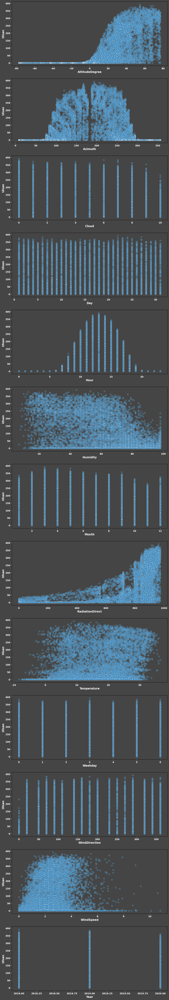

In [33]:
fig, ax = plt.subplots(nrows = len(df_train.select_dtypes("number").columns.difference([target])),
                       figsize=(12, 6*len(df_train.select_dtypes("number").columns.difference([target]))))
for i, col in enumerate(df_train.select_dtypes("number").columns.difference([target])):
    sns.scatterplot(data=df_train, x=col, y=target, ax=ax[i], alpha=0.5)

<IPython.core.display.Javascript object>

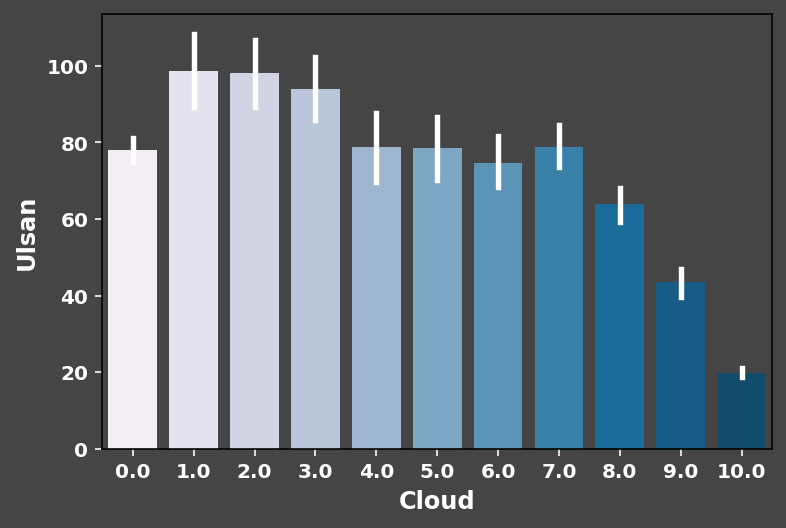

In [34]:
sns.barplot(data=df_train, x="Cloud", y=target, palette="PuBu", errcolor='white')

<IPython.core.display.Javascript object>

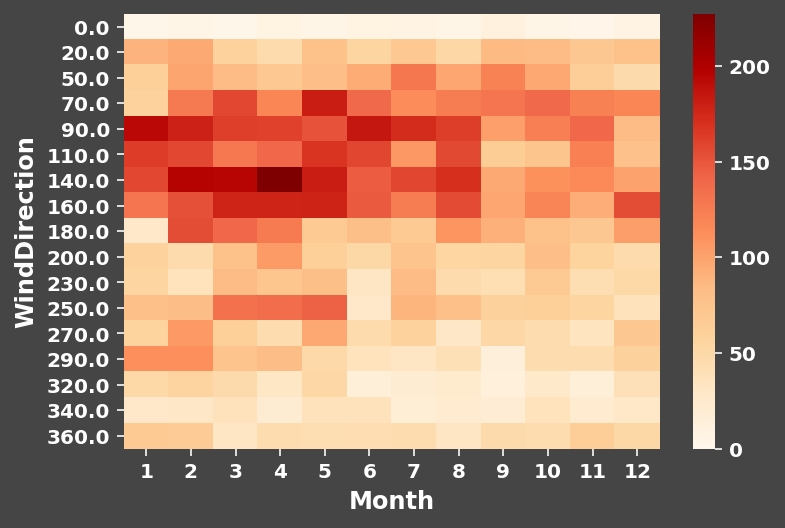

In [35]:
df_heat = df_train.groupby(by=["WindDirection", "Month"])[target].mean()
sns.heatmap(df_heat.unstack(), vmin=0, cmap='OrRd')

동남풍이 불면 발전량이 올라가는 특징을 확인할 수 있었다. 바닷바람이 불면 구름을 동반할 줄 알았는데 아닌가?

<IPython.core.display.Javascript object>

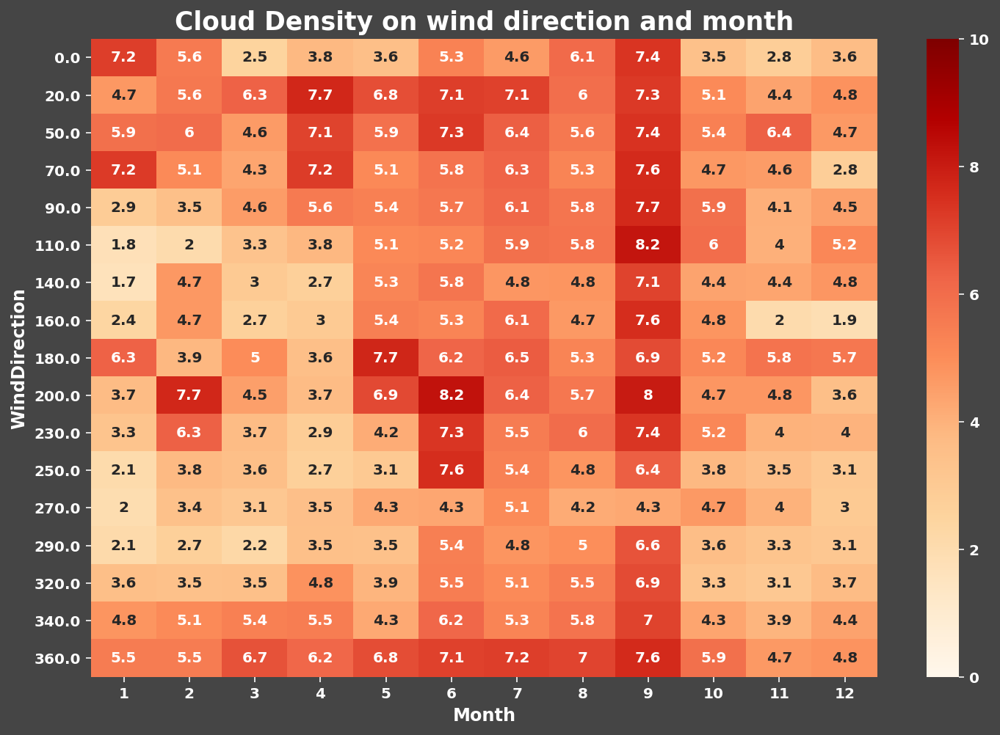

In [36]:
fig, ax = plt.subplots(figsize=(12,8))
df_heat = df_train.groupby(by=["WindDirection", "Month"])["Cloud"].mean()
sns.heatmap(df_heat.unstack(), vmin=0, vmax=10, cmap='OrRd', ax=ax, annot=True)
ax.set_title("Cloud Density on wind direction and month")
plt.show()

<IPython.core.display.Javascript object>

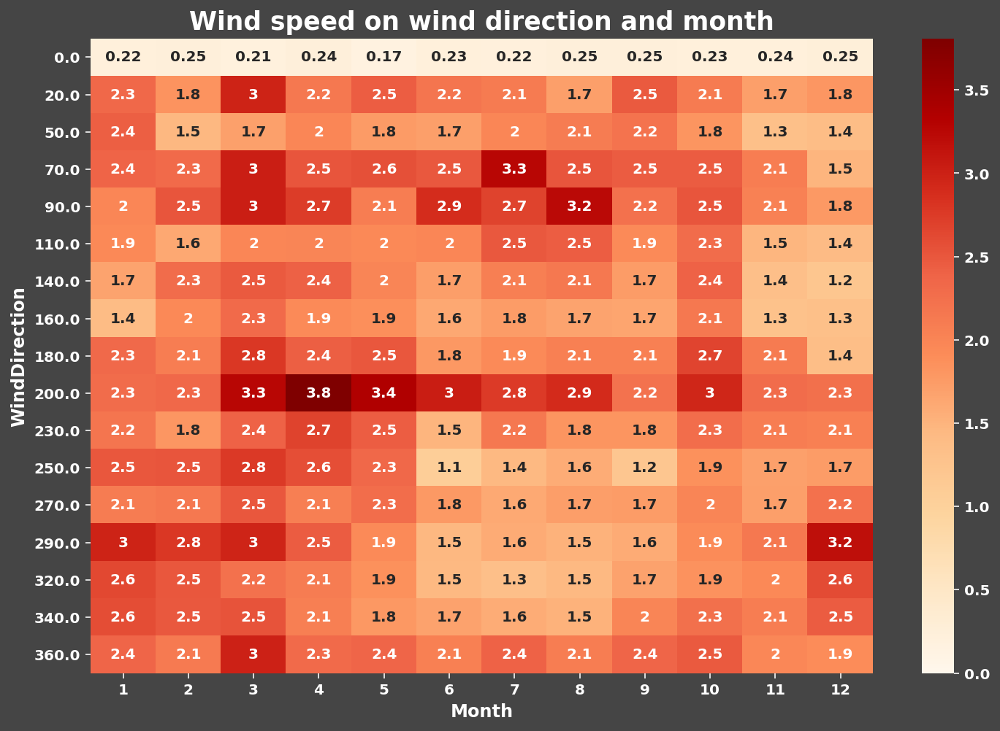

In [37]:
fig, ax = plt.subplots(figsize=(12,8))
df_heat = df_train.groupby(by=["WindDirection", "Month"])["WindSpeed"].mean()
sns.heatmap(df_heat.unstack(), vmin=0, cmap='OrRd', ax=ax, annot=True)
ax.set_title("Wind speed on wind direction and month")
plt.show()

<IPython.core.display.Javascript object>

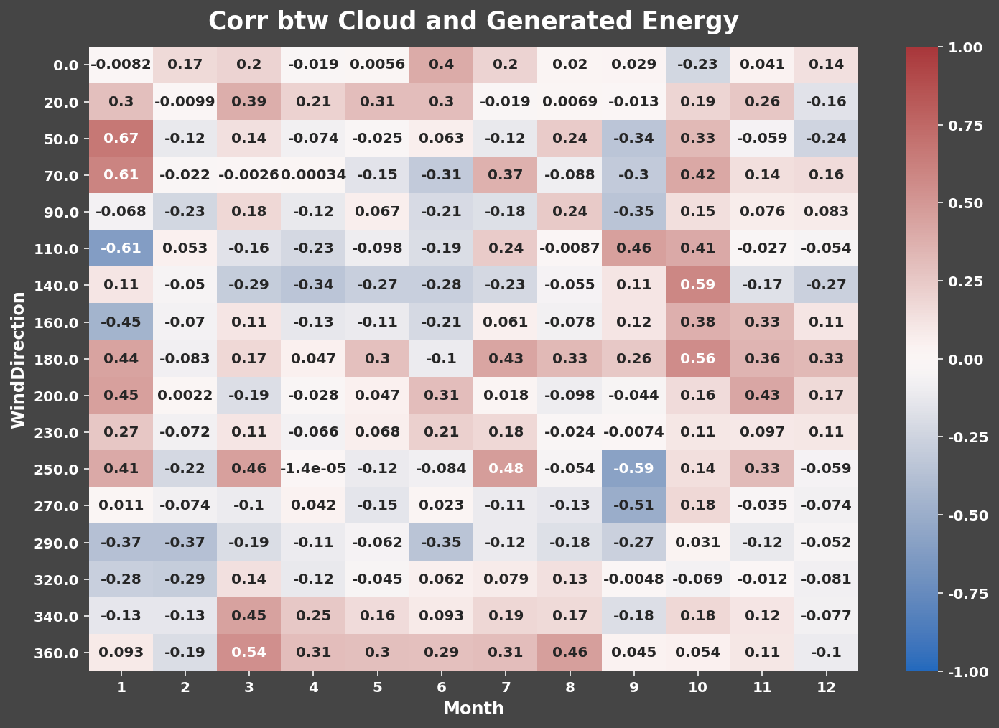

In [38]:
df_heat = df_train.groupby(by=["WindDirection", "Month"])["WindSpeed"].corr(df_train["Cloud"])
# df_heat
fig, ax = plt.subplots(figsize=(12,8))
sns.heatmap(df_heat.unstack(), vmin=-1, vmax=1, cmap='vlag', ax=ax, annot=True, )
ax.set_title("Corr btw Cloud and Generated Energy", pad=12)
plt.show()

계절풍의 영향을 받지 않을까 싶어 구름과 발전량의 상관관계를 바람의

<IPython.core.display.Javascript object>

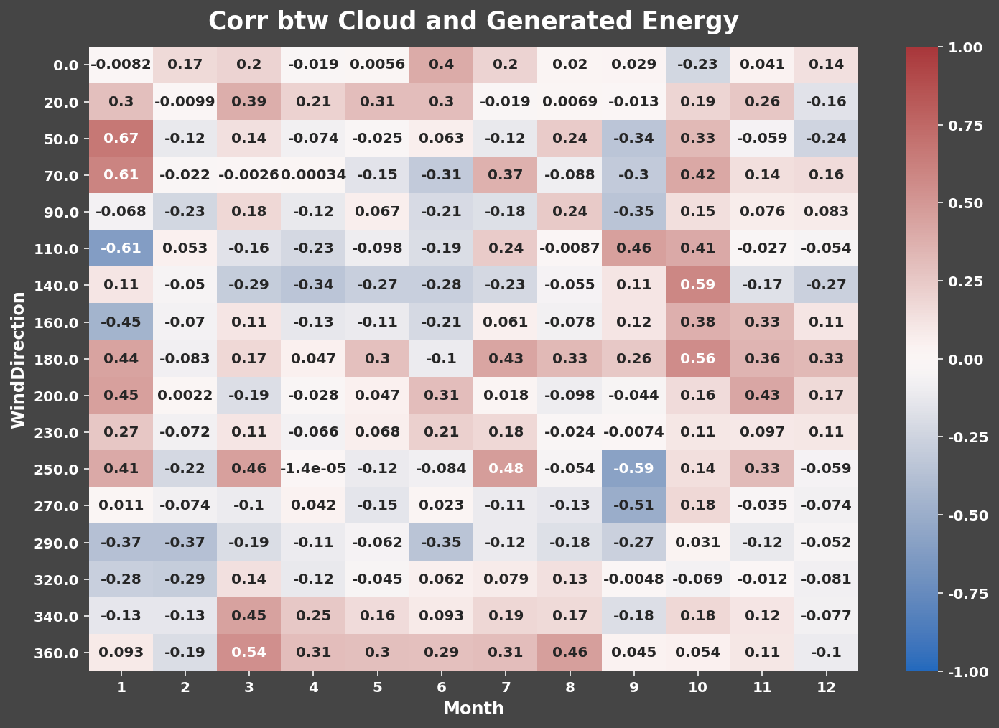

In [39]:
df_heat = df_train.groupby(by=["WindDirection", "Month"])["WindSpeed"].corr(df_train["Cloud"])
# df_heat
fig, ax = plt.subplots(figsize=(12,8))
sns.heatmap(df_heat.unstack(), vmin=-1, vmax=1, cmap='vlag', ax=ax, annot=True, )
ax.set_title("Corr btw Cloud and Generated Energy", pad=12)
plt.show()

<IPython.core.display.Javascript object>

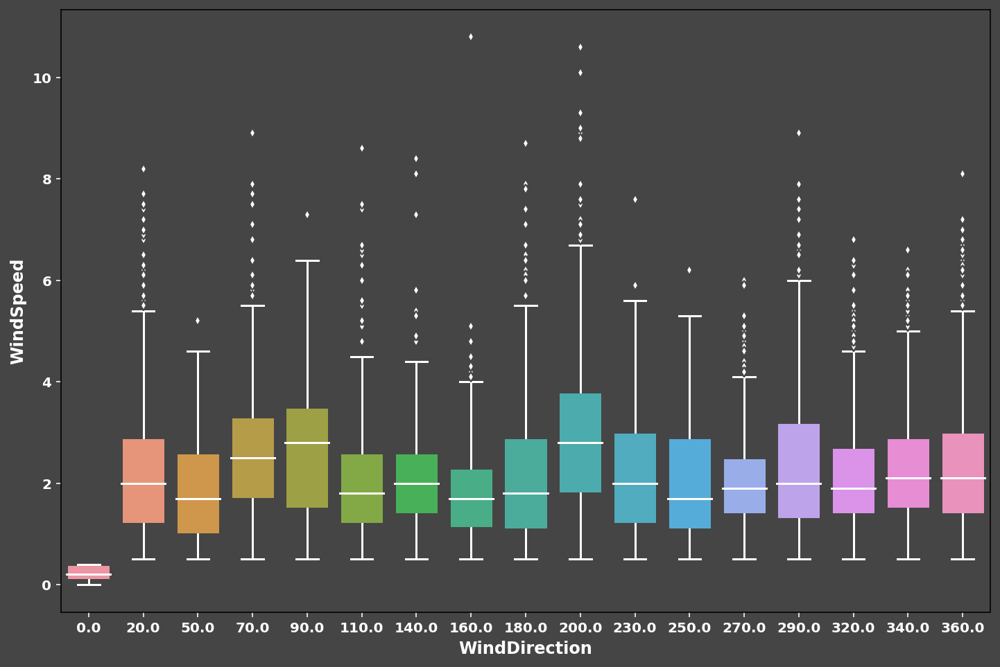

In [40]:
fig = plt.figure(figsize=(12,8))
sns.boxplot(data=df_train, x='WindDirection', y='WindSpeed', **PROPS_BOXPLOT)

풍향을 360도까지 주었는데 0도는 뭘까 보니 바람이 없거나 약할 때 0도를 준 것으로 보인다.<br>
풍향 17개는 카테고리로 놓고 TargetEncoding 하겠다.<br>
![풍향](https://lh3.googleusercontent.com/proxy/YYQHm0iOWpVGE_EyD_MuRM-ZdWtXCV7xMkoO0gJB6vLvQ2TJ6WYSVvB8z6wqJfnG1OI_VdqUCG3taYxPfNAGqKd8_40Ev2YsezRQV1WJxZmer-tjYG2OdAEtBzO4Ho4vwSvFh3OuHowLcMLnnJILG7ROgR76Z8xL-LFsTMCGweYtIuoYXOJwLJhz6A3lM--CuYW6HSF_1c_barYshtGLs69fQXKGhWz79Is)

<IPython.core.display.Javascript object>

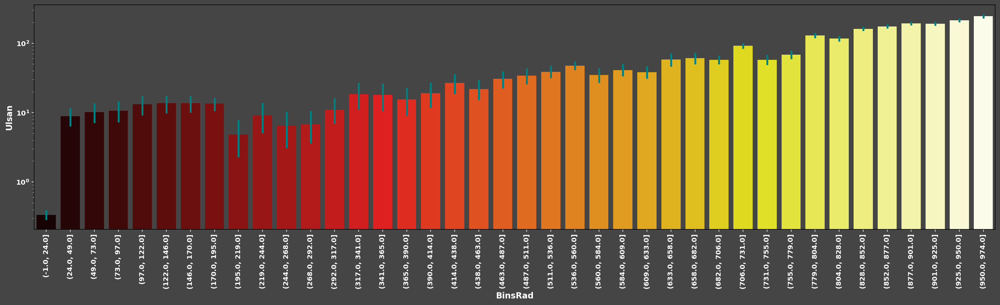

In [41]:
fig = plt.figure(figsize=(25,6))
df_train["BinsRad"] = pd.cut(df_train["RadiationDirect"], bins=40, precision=0)
sns.barplot(data=df_train, x="BinsRad",y=target, errcolor='teal', palette="hot")
df_train.drop(columns="BinsRad", inplace=True)
plt.yscale('log')
plt.xticks(rotation=90)
plt.show()

In [42]:
df_train.RadiationDirect.min()

<IPython.core.display.Javascript object>

0.0

<IPython.core.display.Javascript object>

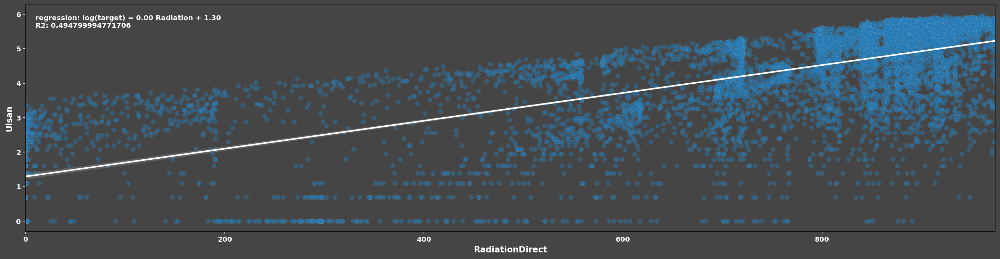

In [43]:
from sklearn.linear_model import LinearRegression
fig, ax = plt.subplots(figsize=(25,6))
lr = LinearRegression(normalize=True)
df_temp=df_train.loc[df_train[target]!=0]
lr.fit(np.array(df_temp["RadiationDirect"]).reshape(-1,1), np.log(df_temp[target]))

sns.regplot(x=df_temp["RadiationDirect"], y=np.log(df_temp[target]), line_kws=line_kws, scatter_kws=scatter_kws, ax=ax)
ax.annotate(f'regression: log(target) = {lr.coef_[0]:.2f} Radiation + {lr.intercept_:.2f}\nR2: {lr.score(np.array(df_temp["RadiationDirect"]).reshape(-1,1), np.log(df_temp[target]))}',
            color='white', xy=(0.01,0.9), xycoords="axes fraction")
plt.show()

타겟 값을 로그로 씌우면 RadiationDirect와 어느 정도 선형 관계를 보이는 것 같다.

<IPython.core.display.Javascript object>

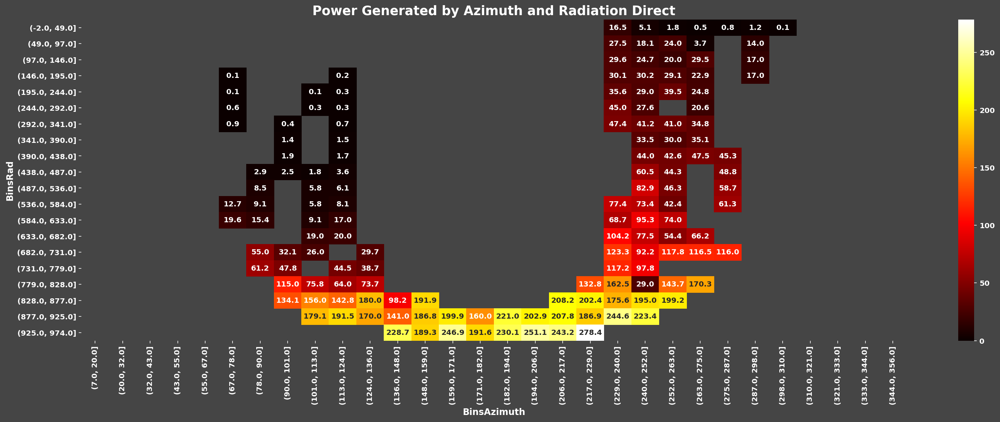

In [44]:
# fig = plt.figure(figsize=(12,6))
# sns.kdeplot(data=df_train, x="Azimuth", y="RadiationDirect", weights=target)
# plt.ylim(200, 1200)
# plt.xlim(0,360)

fig, ax = plt.subplots(figsize=(25,8))
df_train["BinsAzimuth"] = pd.cut(df_train["Azimuth"], bins=30, precision=0, include_lowest=True)
df_train["BinsRad"] = pd.cut(df_train["RadiationDirect"], bins=20, precision=0, include_lowest=True)
df_heat = df_train.groupby(by=["BinsRad", "BinsAzimuth"])[target].mean()
mask = (df_heat == 0).unstack()
sns.heatmap(df_heat.unstack(), vmin=0, cmap='hot', ax=ax, mask=mask, annot=True, fmt='.1f')
ax.set_title("Power Generated by Azimuth and Radiation Direct")
plt.show()
df_train.drop(columns=['BinsAzimuth', 'BinsRad'], inplace=True)

## 방위각, 조사량과 발전량
태양 방위각이 남서방향으로 20도 치우쳐있을 때 최대 발전량을 보입니다.<br>
이는 울산태양발전소의 패널 설치각이 20도로 주어져 있기 때문인 것으로 보입니다.<br>
설치각과 Azimuth 의 차이 절대값을 Feature로 만들어주겠습니다.


In [45]:
def change_azimuth(azimuth):
    if azimuth <= 20:
        return 160 + azimuth
    else:
        return np.abs(200 - azimuth)
df_train["PannelAzimuth"] = df_train["Azimuth"].apply(change_azimuth)
# df_train.drop(columns='Azimuth', inplace=True)
df_val["PannelAzimuth"] = df_val["Azimuth"].apply(change_azimuth)
# df_val.drop(columns='Azimuth', inplace=True)
df_test["PannelAzimuth"] = df_test["Azimuth"].apply(change_azimuth)
# df_test.drop(columns='Azimuth', inplace=True)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

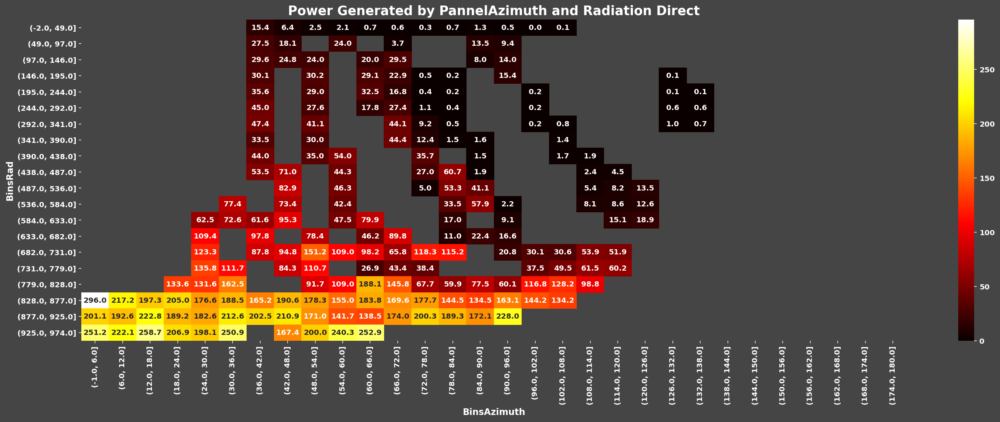

In [46]:
fig, ax = plt.subplots(figsize=(25,8))
df_train["BinsAzimuth"] = pd.cut(df_train["PannelAzimuth"], bins=30, precision=0, include_lowest=True)
df_train["BinsRad"] = pd.cut(df_train["RadiationDirect"], bins=20, precision=0, include_lowest=True)
df_heat = df_train.groupby(by=["BinsRad", "BinsAzimuth"])[target].mean()
mask = (df_heat == 0).unstack()
sns.heatmap(df_heat.unstack(), vmin=0, cmap='hot', ax=ax, mask=mask, annot=True, fmt='.1f')
ax.set_title("Power Generated by PannelAzimuth and Radiation Direct")
plt.show()
df_train.drop(columns=['BinsAzimuth', 'BinsRad'], inplace=True)

<IPython.core.display.Javascript object>

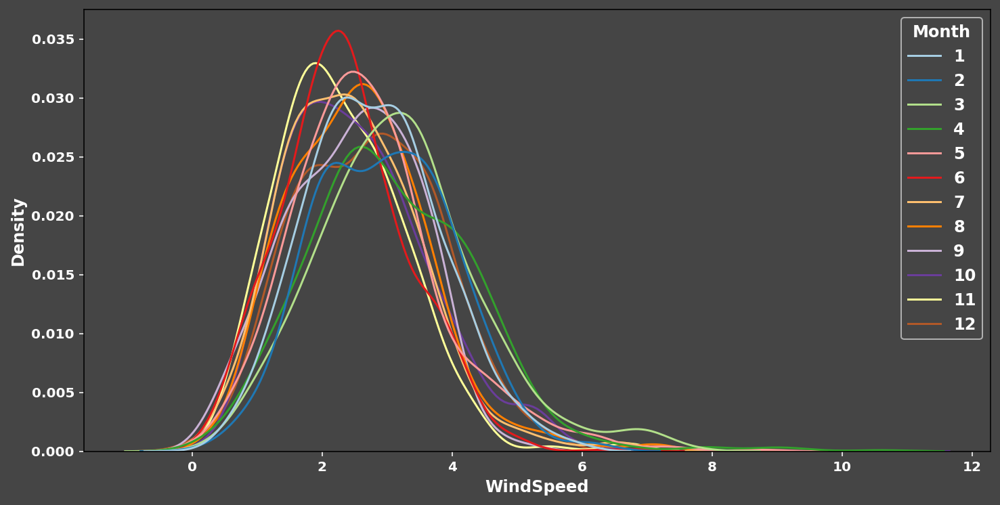

In [47]:
fig = plt.figure(figsize=(12,6))
sns.kdeplot(data=df_train, x="WindSpeed", hue="Month", palette="Paired", weights=target)

<IPython.core.display.Javascript object>

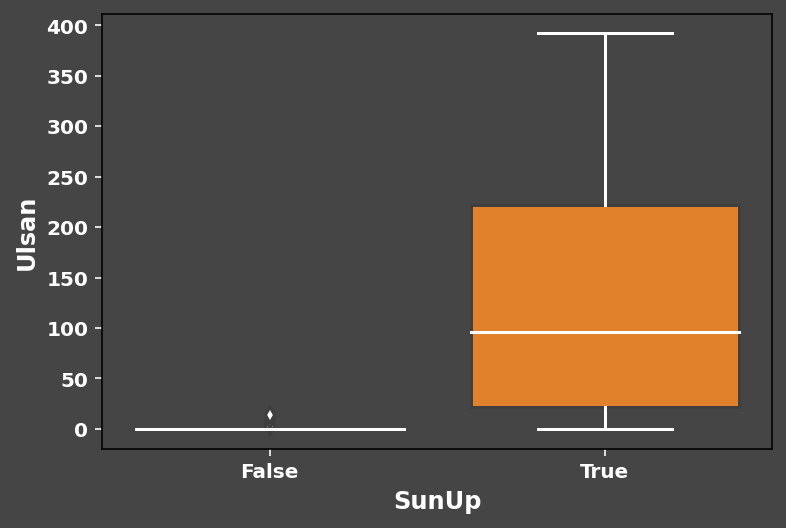

In [48]:
sns.boxplot(data=df_train, x="SunUp", y=target, **PROPS_BOXPLOT)

<IPython.core.display.Javascript object>

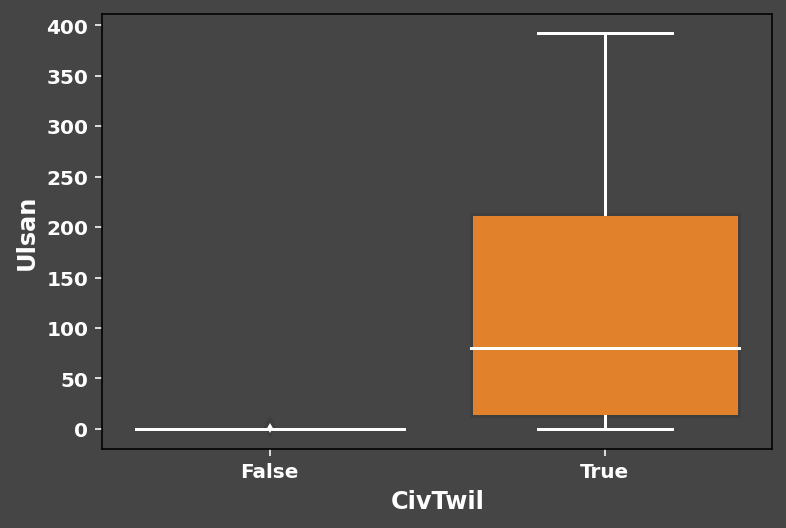

In [49]:
sns.boxplot(data=df_train, x="CivTwil", y=target, **PROPS_BOXPLOT)

<IPython.core.display.Javascript object>

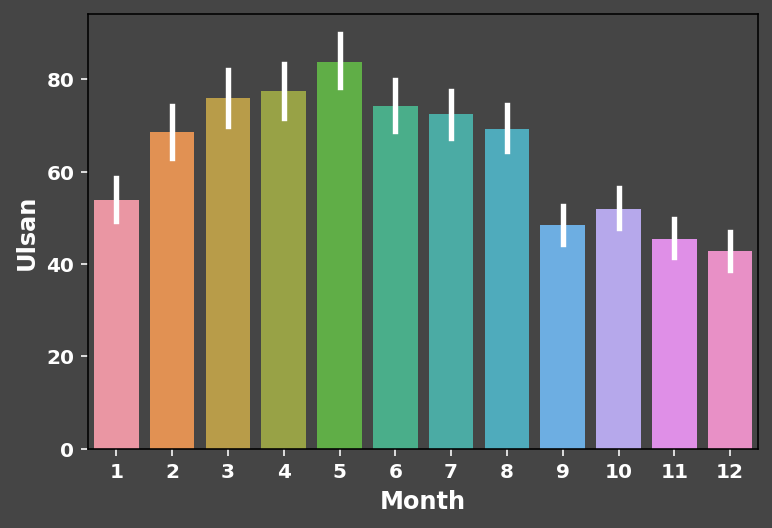

In [50]:
sns.barplot(data=df_train, x='Month', y=target, errcolor='white')

월별로 발전량에 차이가 있음을 알 수 있습니다.

<IPython.core.display.Javascript object>

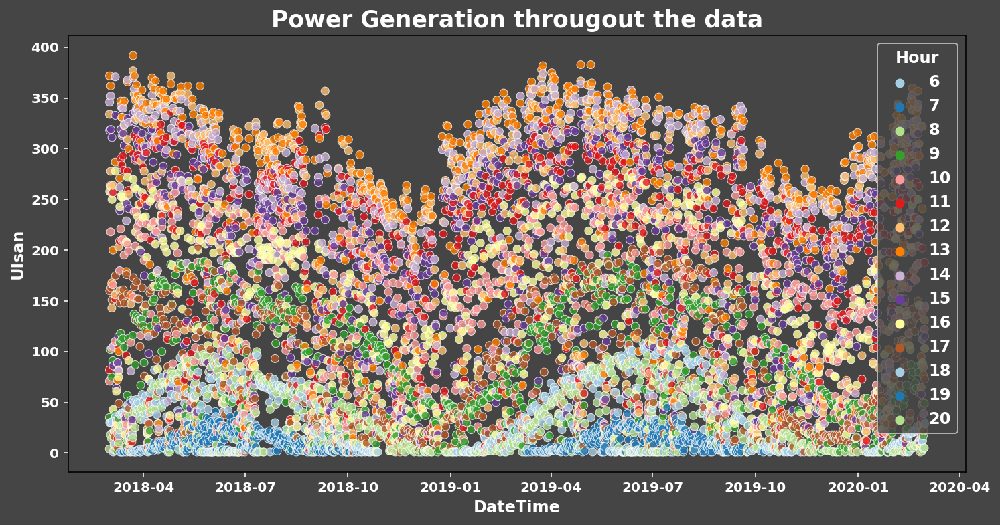

In [51]:
fig, ax = plt.subplots(figsize=(12,6))
# 해가 졌을 때 발전량이 0인 값이 많을 것이므로 plot시 제외하고 확인하겠습니다.
sns.scatterplot(data=df_train.loc[df_train[target]>0], x="DateTime", y=target, hue="Hour", palette="Paired", alpha=0.8, ax=ax)
ax.set_title("Power Generation througout the data")
plt.show()

모네 작품인줄...

<IPython.core.display.Javascript object>

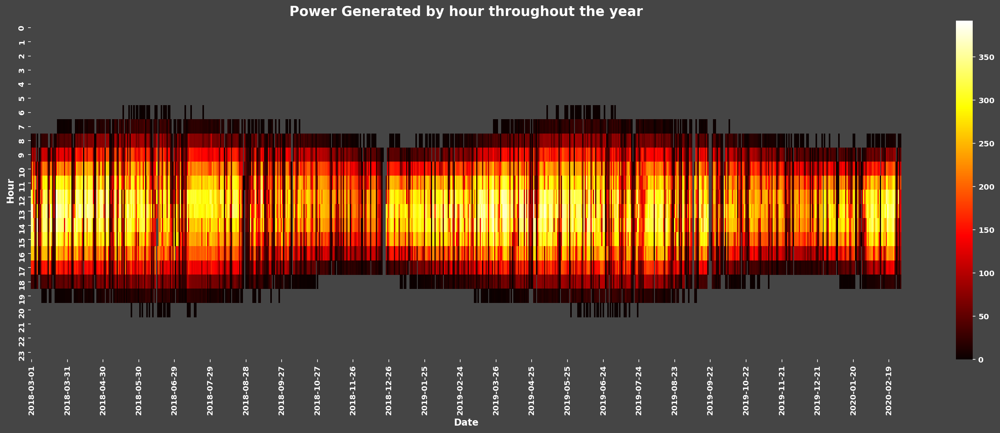

In [52]:
fig, ax = plt.subplots(figsize=(25,8))
df_heat = df_train.groupby(by=["Hour", "Date"])[target].mean()
mask = (df_heat == 0).unstack()
sns.heatmap(df_heat.unstack(), vmin=0, cmap='hot', ax=ax, xticklabels=30, mask=mask)
ax.set_title("Power Generated by hour throughout the year")
plt.show()

훈련데이터 구간의 시간별 발전량 평균을 히트맵으로 확인해보았습니다.
해가 짧아지는 9월부터 발전량과 발전 시간범위가 줄어들고 1월부터 늘어나기 시작해 봄, 여름에 발전량과 발전시간이 최대가 됩니다.<br>
2018년 12월 26일 직전에 발전량이 0인 날이 며칠 있는 것으로 보이는데 무슨 일인지 확인해보겠습니다.

In [53]:
df_ulsan.loc[(df_ulsan["Date"]<=datetime.date(2018,12,26))&(df_ulsan["Date"]>datetime.date(2018,12,15))&df_ulsan["NauTwil"]&(df_ulsan[target]<10)]

<IPython.core.display.Javascript object>

,DateTime,Ulsan,Temperature,Humidity,Cloud,WindDirection,WindSpeed,SunUp,CivTwil,NauTwil,AstTwil,Azimuth,AltitudeDegree,RadiationDirect,Fog,Year,Month,Day,Weekday,Hour,Date
6966,2018-12-16 07:00:00+09:00,0,2.5,25.0,10.0,360.0,2.1,False,True,True,True,114.9338,-5.3026,0.0000,False,2018,12,16,6,7,2018-12-16
6967,2018-12-16 08:00:00+09:00,0,1.3,36.0,10.0,360.0,1.3,True,True,True,True,123.6736,5.4950,279.2012,False,2018,12,16,6,8,2018-12-16
6977,2018-12-16 18:00:00+09:00,0,2.6,92.0,5.0,320.0,3.1,False,False,True,True,248.3162,-9.8571,0.0000,False,2018,12,16,6,18,2018-12-16
6990,2018-12-17 07:00:00+09:00,0,-0.4,86.0,0.0,110.0,0.8,False,True,True,True,114.9021,-5.4178,0.0000,False,2018,12,17,0,7,2018-12-17
6991,2018-12-17 08:00:00+09:00,0,0.6,93.0,0.0,290.0,0.7,True,True,True,True,123.6299,5.3864,271.7794,False,2018,12,17,0,8,2018-12-17
7001,2018-12-17 18:00:00+09:00,0,5.5,25.0,0.0,290.0,2.4,False,False,True,True,248.2189,-9.7876,0.0000,False,2018,12,17,0,18,2018-12-17
7014,2018-12-18 07:00:00+09:00,0,2.3,58.0,0.0,320.0,2.4,False,True,True,True,114.8639,-5.5289,0.0000,False,2018,12,18,1,7,2018-12-18
7015,2018-12-18 08:00:00+09:00,0,2.2,58.0,0.0,340.0,2.7,True,True,True,True,123.5800,5.2824,264.5854,False,2018,12,18,1,8,2018-12-18
7024,2018-12-18 17:00:00+09:00,5,6.9,42.0,2.0,270.0,1.5,True,True,True,True,239.7901,1.5900,7.5391,False,2018,12,18,1,17,2018-12-18
7025,2018-12-18 18:00:00+09:00,0,5.9,46.0,2.0,250.0,1.3,False,False,True,True,248.1278,-9.7131,0.0000,False,2018,12,18,1,18,2018-12-18


구름량과는 상관 없어보이는데 혹시 습도의 영향인지 확인해보겠습니다.

<IPython.core.display.Javascript object>

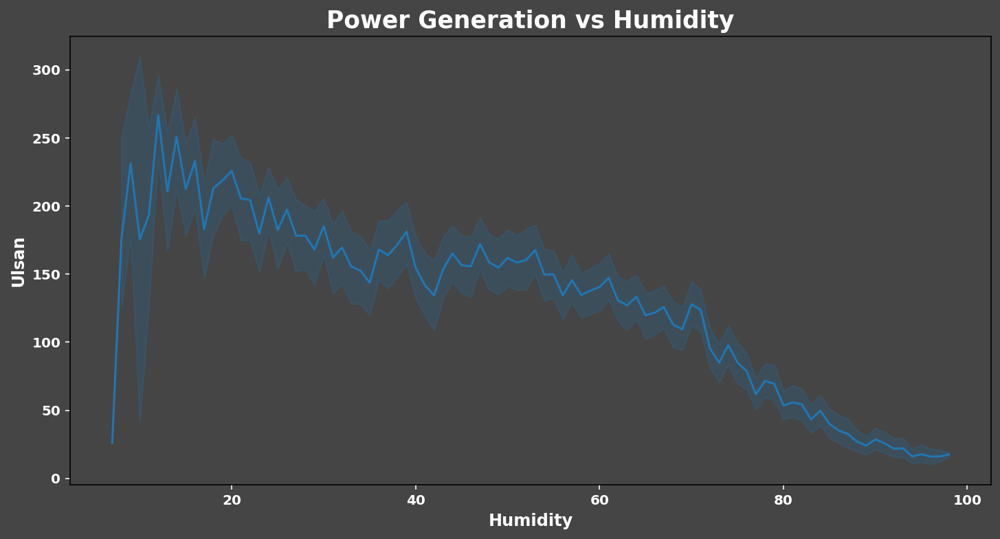

In [54]:
fig, ax = plt.subplots(figsize=(12,6))
sns.lineplot(data=df_train.loc[df_train["NauTwil"]], x="Humidity", y=target, alpha=1, ax=ax, ci=95)
ax.set_title("Power Generation vs Humidity")
# .rolling()에서 min_periods보다 적은 수의 none-nan 값이 들어오면 해당 그룹을 nan처리해버린다. min_periods를 1로 주어 all-nan인 그룹을 없앴다.
# sns.lineplot(x=df_train["Date"], y=df_train[target].replace(0,np.nan).rolling(window=24*7,center=True, min_periods=1).mean(), alpha=0.8, color="white", linestyle='--', ax=ax)
plt.show()

2018년 12월 21~23일 발전량 0인데, 그 이유가 날씨와는 전혀 상관 없는 것으로 판단됩니다.<br>
눈이 쌓이거나 구름에 태양이 가리지도 않았고, 습도가 아주 높아 안개가 생길 상황도 아니었는데다,<br>지진이나 기타 재해가 있었던 것도 아닌 것으로 검색됩니다.<br>
Prophet 모델 사용시 2018/12/21과 2018/12/23에 변곡지점을 넣도록 하겠습니다.

## 훈련데이터 기간 중 발전량
파란 실선은 각 날짜의 시간당 발전량 평균, 흰 점선은 7일 동안의 발전량 이동평균을 나타낸 것입니다.<br>발전량이 0인 시간을 제외하고 평균내었습니다.

<IPython.core.display.Javascript object>

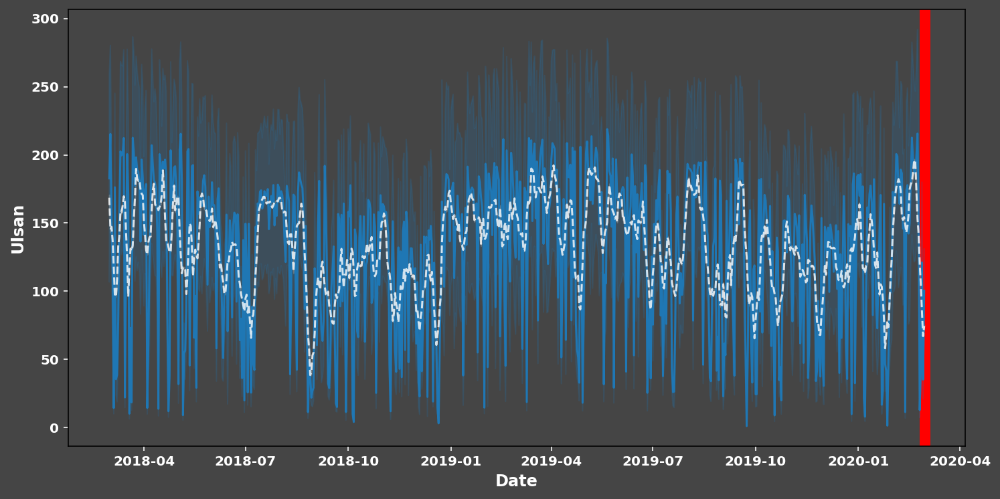

In [55]:
fig, ax = plt.subplots(figsize=(12,6))
sns.lineplot(data=df_train.loc[df_train[target]>0], x="Date", y=target , alpha=1, ax=ax, ci=95)
# .rolling()에서 min_periods보다 적은 수의 none-nan 값이 들어오면 해당 그룹을 nan처리해버린다. min_periods를 1로 주어 all-nan인 그룹을 없앴다.
sns.lineplot(x=df_train["Date"], y=df_train[target].replace(0,np.nan).rolling(window=24*7,center=True, min_periods=1).mean(), alpha=0.8, color="white", linestyle='--', ax=ax)

ax.axvline(date_val_start, color='red', lw=8, zorder=-1)
plt.show()

In [56]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline, FeatureUnion
from sklearn.compose import ColumnTransformer
from sklearn.compose import make_column_selector as selector
from sklearn.tree import DecisionTreeClassifier
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.model_selection import cross_val_score, KFold
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import RobustScaler
import category_encoders as ce
from xgboost import XGBRegressor

# Library for hyperparameter tuning
import optuna


<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [57]:
import fbprophet
Prophet = fbprophet.Prophet
df_train["DateTime"] = df_train["DateTime"].dt.tz_localize(tz=None, ambiguous=False)
df_val["DateTime"] = df_val["DateTime"].dt.tz_localize(tz=None, ambiguous=False)
df_test["DateTime"] = df_test["DateTime"].dt.tz_localize(tz=None, ambiguous=False)

ds_train = df_train.loc[:,["DateTime", "Ulsan"]].rename(columns={"DateTime": "ds", "Ulsan": "y"})
ds_val = df_val.loc[:, ["DateTime", "Ulsan"]].rename(columns={"DateTime": "ds", "Ulsan": "y"})
ds_test = df_test.loc[:, ["DateTime", "Ulsan"]].rename(columns={"DateTime": "ds", "Ulsan": "y"})

<IPython.core.display.Javascript object>

In [58]:
%%time
# m = Prophet(mcmc_samples=300, changepoint_prior_scale=0.01, seasonality_mode='multiplicative',
            # yearly_seasonality=10, weekly_seasonality=False, daily_seasonality=4)
m=Prophet(seasonality_mode='multiplicative', yearly_seasonality=4, weekly_seasonality=False, daily_seasonality=4)
m.fit(ds_train)


<IPython.core.display.Javascript object>

CPU times: user 16 s, sys: 283 ms, total: 16.2 s
Wall time: 16.5 s


<IPython.core.display.Javascript object>

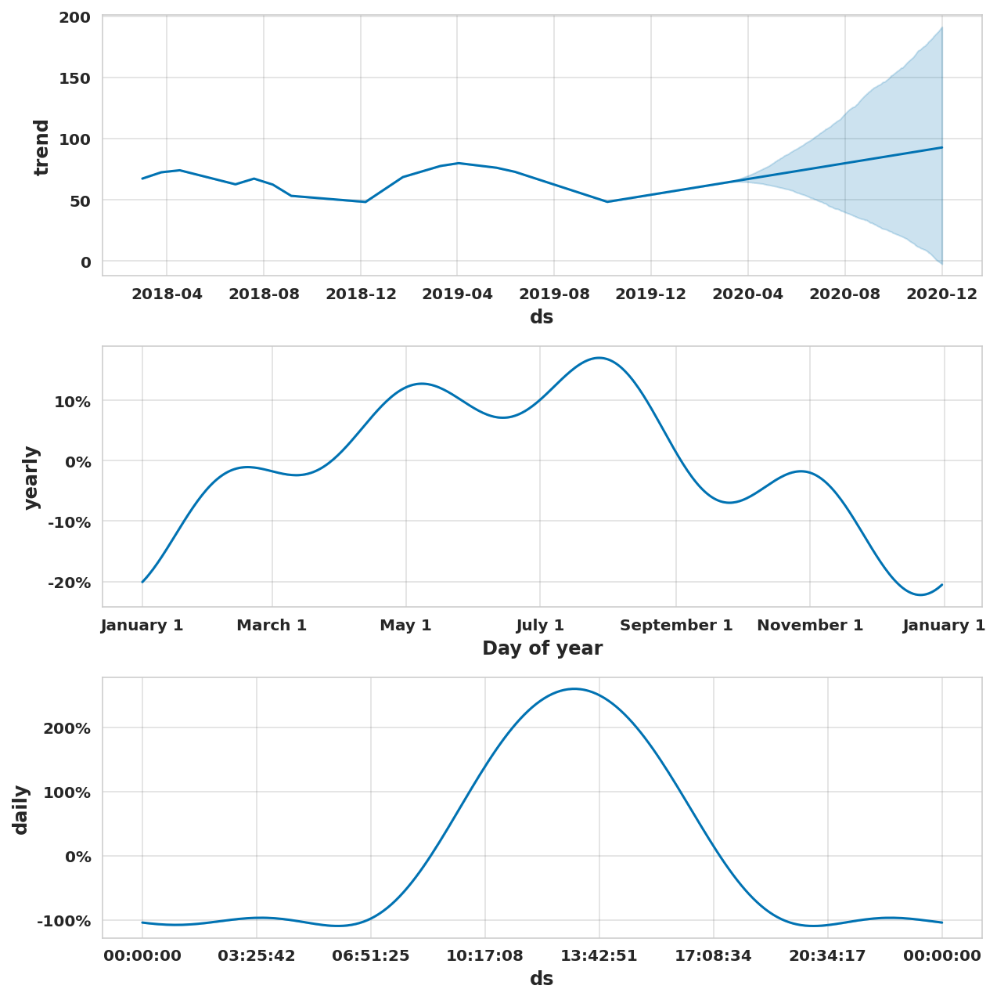

In [59]:
future = m.make_future_dataframe(periods=len(ds_val), freq='1H')
forecast = m.predict(future)
with sns.axes_style("whitegrid"):
    f = m.plot_components(forecast)

In [60]:
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]

<IPython.core.display.Javascript object>

,ds,yhat,yhat_lower,yhat_upper
0,2018-03-01 01:00:00,-6.1219,-74.7925,57.3968
1,2018-03-01 02:00:00,-3.7447,-67.5782,64.3496
2,2018-03-01 03:00:00,0.4469,-68.0961,64.4877
3,2018-03-01 04:00:00,0.7527,-65.7222,70.2097
4,2018-03-01 05:00:00,-4.1007,-69.4977,64.7273
...,...,...,...,...
24138,2020-11-30 19:00:00,-8.5648,-75.6404,59.2727
24139,2020-11-30 20:00:00,-22.8046,-90.6607,51.5113
24140,2020-11-30 21:00:00,-18.7318,-85.7635,51.5867
24141,2020-11-30 22:00:00,-12.0469,-81.6721,53.1401


In [61]:
from sklearn.metrics import mean_squared_error

df_val_result = ds_val.merge(forecast[["ds", "yhat"]], left_on="ds", right_on="ds")
df_val_result["yhat"] = df_val_result["yhat"].transform(lambda x: x if x>=0 else 0)
rmse_base_val = np.sqrt(mean_squared_error(y_true=df_val_result["y"], y_pred=df_val_result["yhat"]))

future = m.make_future_dataframe(periods=len(ds_val)+len(ds_test), freq='1H')
forecast = m.predict(future)
df_test_result = pd.concat([ds_val, ds_test]).merge(forecast[["ds", "yhat"]], left_on="ds", right_on="ds")
df_test_result["yhat"] = df_test_result["yhat"].transform(lambda x: x if x>=0 else 0)
mask_test = df_test_result["ds"].dt.date >= date_test_start
rmse_base_test = np.sqrt(mean_squared_error(y_true=df_test_result.loc[mask_test, "y"], y_pred=df_test_result.loc[mask_test,"yhat"]))


print(f'Base Prophet Model Validation RMSE: {rmse_base_val:.3f}')
print(f'Base Prophet Model Test RMSE: {rmse_base_test:.3f}')
rmse_baseline_val = np.sqrt(mean_squared_error(y_true=df_val_result["y"], y_pred=[ds_train["y"].mean() for _ in range(len(df_val_result["y"]))]))
rmse_baseline_test = np.sqrt(mean_squared_error(y_true=df_test_result["y"], y_pred=[ds_train["y"].mean() for _ in range(len(df_test_result["y"]))]))
print(f'Baseline(All Values to mean training data y) Validation RMSE: {rmse_baseline_val:.3f}')
print(f'Baseline(All Values to mean training data y) Test RMSE: {rmse_baseline_test:.3f}')

<IPython.core.display.Javascript object>

Base Prophet Model Validation RMSE: 68.286
Base Prophet Model Test RMSE: 60.423
Baseline(All Values to mean training data y) Validation RMSE: 103.768
Baseline(All Values to mean training data y) Test RMSE: 102.514


In [62]:
%%time
import fbprophet
import category_encoders as ce
Prophet = fbprophet.Prophet
df_ulsan["DateTime"] = df_ulsan["DateTime"].dt.tz_localize(tz=None, ambiguous=False)

def feature_engineering(df, is_train):
    df_ = df.copy()
    df_ = df_.loc[:,["DateTime", "Ulsan", "Cloud","RadiationDirect"]]
    df_['RadiationDirect'] = df_['RadiationDirect'].interpolate(method='linear')
    # df_ = df_["DateTime", "Ulsan", "Temperature", "Humidity", "Cloud", "WindDirection", "WindSpeed", "SunUp", "Twilight", "Azimuth", "AltitudeDegree", "RadiationDirect"]
    df_ = df_.rename(columns={"DateTime": "ds", "Ulsan": "y"})
    # tarenc = ce.TargetEncoder(cols=["WindDirection", "SunUp", "Twilight"])
    # if is_train:
    #     df_ = tarenc.fit_transform(df_, df_["y"])
    # else:
    #     df_ = tarenc.transform(df_)
    return df_
ds_train = feature_engineering(df_train, True)
ds_val = feature_engineering(df_val, False)
ds_test = feature_engineering(df_test, False)

m=Prophet(seasonality_mode='multiplicative', yearly_seasonality=6, weekly_seasonality=False, daily_seasonality=4)
m.add_regressor('Cloud', prior_scale=0.5, mode='multiplicative')
m.add_regressor('RadiationDirect', prior_scale=0.5, mode='multiplicative')
m.fit(ds_train, verbose=2)


<IPython.core.display.Javascript object>

CPU times: user 18.6 s, sys: 188 ms, total: 18.8 s
Wall time: 18.6 s


<IPython.core.display.Javascript object>

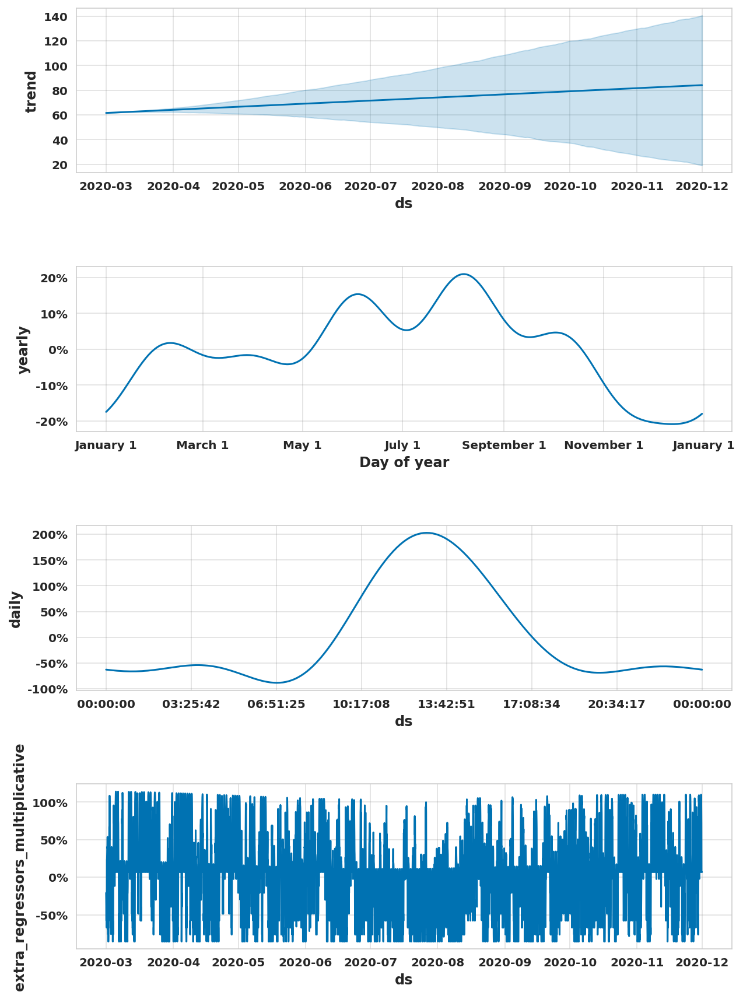

In [63]:

future_ = m.make_future_dataframe(periods=len(ds_val), freq='1H')
futures = future.merge(ds_val[["ds","Cloud", "RadiationDirect"]], on="ds")
forecast = m.predict(futures)
with sns.axes_style("whitegrid"):
    f = m.plot_components(forecast)


In [64]:
df_val_result = ds_val.merge(forecast[["ds", "yhat"]], left_on="ds", right_on="ds")
df_val_result["yhat"] = df_val_result["yhat"].transform(lambda x: x if x>=0 else 0)
rmse_base_add_reg_val = np.sqrt(mean_squared_error(y_true=df_val_result["y"], y_pred=df_val_result["yhat"]))

period_test = pd.concat([ds_val, ds_test])
future_ = m.make_future_dataframe(periods=len(period_test), freq='1H')
futures = future.merge(period_test[["ds","Cloud", "RadiationDirect"]], on="ds")
forecast = m.predict(futures)

df_test_result = period_test.merge(forecast[["ds", "yhat"]], left_on="ds", right_on="ds")
df_test_result["yhat"] = df_test_result["yhat"].transform(lambda x: x if x>=0 else 0)
mask_test = df_test_result["ds"].dt.date >= date_test_start
rmse_base_add_reg_test = np.sqrt(mean_squared_error(y_true=df_test_result.loc[mask_test, "y"], y_pred=df_test_result.loc[mask_test,"yhat"]))

print(f'Baseline(All Values to mean training data y) Validation RMSE: {rmse_baseline_val:.3f}')
print(f'Baseline(All Values to mean training data y) Test RMSE: {rmse_baseline_test:.3f}')

print(f'Base Prophet Model Validation RMSE: {rmse_base_val:.3f}')
print(f'Base Prophet Model Test RMSE: {rmse_base_test:.3f}')

print(f'Base Add Regressor Model Validation RMSE: {rmse_base_add_reg_val:.3f}')
print(f'Base Add Regressor Model Test RMSE: {rmse_base_add_reg_test:.3f}')

<IPython.core.display.Javascript object>

Baseline(All Values to mean training data y) Validation RMSE: 103.768
Baseline(All Values to mean training data y) Test RMSE: 102.514
Base Prophet Model Validation RMSE: 68.286
Base Prophet Model Test RMSE: 60.423
Base Add Regressor Model Validation RMSE: 56.552
Base Add Regressor Model Test RMSE: 52.032


In [65]:
df_train.info()

<IPython.core.display.Javascript object>

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17543 entries, 0 to 17542
Data columns (total 22 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   DateTime         17543 non-null  datetime64[ns]
 1   Ulsan            17543 non-null  int64         
 2   Temperature      17543 non-null  float64       
 3   Humidity         17543 non-null  float64       
 4   Cloud            17543 non-null  float64       
 5   WindDirection    17543 non-null  float64       
 6   WindSpeed        17543 non-null  float64       
 7   SunUp            17543 non-null  bool          
 8   CivTwil          17543 non-null  bool          
 9   NauTwil          17543 non-null  bool          
 10  AstTwil          17543 non-null  bool          
 11  Azimuth          17543 non-null  float64       
 12  AltitudeDegree   17543 non-null  float64       
 13  RadiationDirect  17540 non-null  float64       
 14  Fog              17543 non-null  bool 

In [66]:
cols_xgb_category = ["WindDirection", "SunUp", "CivTwil", "AstTwil", "Month", "Day", "Weekday", "Fog"]
cols_xgb_drop = ["Date", "DateTime"]

<IPython.core.display.Javascript object>

In [67]:
tarenc = ce.TargetEncoder(cols=cols_xgb_category)
X_train = df_train.copy()
y_train = X_train[target]
X_train.drop(columns=[target]+cols_xgb_drop, inplace=True)
X_train = tarenc.fit_transform(X_train, y_train)
X_val = df_val.copy()
y_val = X_val[target]
X_val.drop(columns=[target]+cols_xgb_drop, inplace=True)
X_val = tarenc.transform(X_val)
X_test = df_test.copy()
y_test = X_test[target]
X_test.drop(columns=[target]+cols_xgb_drop, inplace=True)
X_test = tarenc.transform(X_test)

cols_rbst = X_train.columns.difference(cols_xgb_category)
rbst = RobustScaler()
X_train.loc[:, cols_rbst] = rbst.fit_transform(X_train[cols_rbst])
X_val.loc[:, cols_rbst] = rbst.fit_transform(X_val[cols_rbst])
X_test.loc[:, cols_rbst] = rbst.fit_transform(X_test[cols_rbst])
eval_set = [(X_train, y_train), 
            (X_val, y_val)]
xgbrg=XGBRegressor(subsample=0.7, random_state=123,
                   eval_set = eval_set,
                   early_stopping_rounds=20, verbosity=3)
xgbrg.fit(X_train, y_train)
y_pred = xgbrg.predict(X_val)
y_pred = pd.Series(y_pred).transform(lambda x: x if x>=0 else 0)
rmse_base_xgb_reg_val = np.sqrt(mean_squared_error(y_true=y_val, y_pred=y_pred))
y_pred = xgbrg.predict(X_test)
y_pred = pd.Series(y_pred).transform(lambda x: x if x>=0 else 0)
rmse_base_xgb_reg_test = np.sqrt(mean_squared_error(y_true=y_test, y_pred=y_pred))


print(f'Base XGB Model Validation RMSE: {rmse_base_xgb_reg_val:.3f}')
print(f'Base XGB Model Test RMSE: {rmse_base_xgb_reg_test:.3f}')

print(f'Baseline(All Values to mean training data y) Validation RMSE: {rmse_baseline_val:.3f}')
print(f'Baseline(All Values to mean training data y) Test RMSE: {rmse_baseline_test:.3f}')

print(f'Base Prophet Model Validation RMSE: {rmse_base_val:.3f}')
print(f'Base Prophet Model Test RMSE: {rmse_base_test:.3f}')

print(f'Base Add Regressor Model Validation RMSE: {rmse_base_add_reg_val:.3f}')
print(f'Base Add Regressor Model Test RMSE: {rmse_base_add_reg_test:.3f}')

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/category_encoders/utils.py:21: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



[07:55:32] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[07:55:33] INFO: /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[07:55:33] INFO: /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[07:55:33] INFO: /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[07:55:33] INFO: /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[07:55:33] INFO: /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[07:55:33] INFO: /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[07:55:33] INFO: /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes

## 타겟값의 log화

EDA 과정에서 타겟 값에 log를 취하면 `RadiationDirect`에 대해 좀 더 Linear 한 분포를 보이는 것을 확인했습니다.<br>
발전량에 조사량이 직접적으로 영향을 줄 것이라고 생각하기 때문에 log를 취한 타겟 값을 y 값으로 지정하고 모델을 훈련시켜보고, 그 결과를 확인해보겠습니다.

In [68]:
import fbprophet
Prophet = fbprophet.Prophet
# target 값을 log씌워서 다시 계산해보겠습니다.
df_train[target] = np.log1p(df_train[target])
df_val[target] = np.log1p(df_val[target])
df_test[target] = np.log1p(df_test[target])

ds_train = df_train.loc[:,["DateTime", "Ulsan"]].rename(columns={"DateTime": "ds", "Ulsan": "y"})
ds_val = df_val.loc[:, ["DateTime", "Ulsan"]].rename(columns={"DateTime": "ds", "Ulsan": "y"})
ds_test = df_test.loc[:, ["DateTime", "Ulsan"]].rename(columns={"DateTime": "ds", "Ulsan": "y"})



<IPython.core.display.Javascript object>

In [113]:
# 예측값을 구하고 에러를 계산할 때는 반대로 로그를 제거해야합니다.
# log1p 에서 log(1+y)를 했기 때문에 역함수를 썼을 때 1보다 작은 값은 0으로 필터링해주겠습니다.
def pred(model, X):
    y_pred = model.predict(X)
    y_pred = inverse_transform(y_pred)
    return y_pred.tolist()

def inverse_transform(y):
    y_scaled = np.expm1(y)
    y_filtered = pd.Series(y_scaled).transform(lambda x: x if x>1 else 0)
    return y_filtered


<IPython.core.display.Javascript object>

In [70]:
%%time
# m = Prophet(mcmc_samples=300, changepoint_prior_scale=0.01, seasonality_mode='multiplicative',
            # yearly_seasonality=10, weekly_seasonality=False, daily_seasonality=4)
m=Prophet(seasonality_mode='multiplicative', yearly_seasonality=4, weekly_seasonality=False, daily_seasonality=4)
m.fit(ds_train)


<IPython.core.display.Javascript object>

CPU times: user 10.4 s, sys: 121 ms, total: 10.5 s
Wall time: 10.4 s


<IPython.core.display.Javascript object>

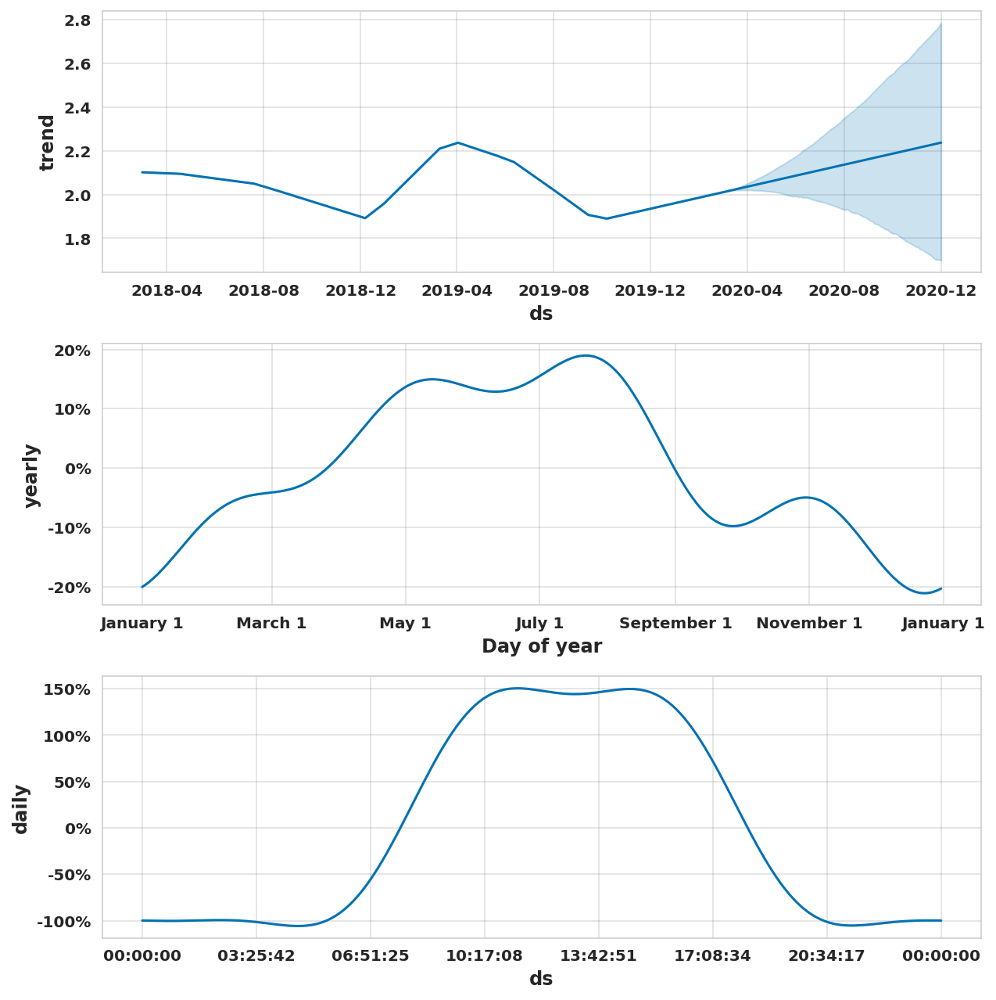

In [71]:
future = m.make_future_dataframe(periods=len(ds_val), freq='1H')
forecast = m.predict(future)
with sns.axes_style("whitegrid"):
    f = m.plot_components(forecast)


In [72]:
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]

<IPython.core.display.Javascript object>

,ds,yhat,yhat_lower,yhat_upper
0,2018-03-01 01:00:00,-0.0906,-1.1710,1.0063
1,2018-03-01 02:00:00,-0.0752,-1.2803,1.0186
2,2018-03-01 03:00:00,-0.0879,-1.2601,1.0093
3,2018-03-01 04:00:00,-0.1685,-1.2304,0.9085
4,2018-03-01 05:00:00,-0.1928,-1.3779,0.9243
...,...,...,...,...
24138,2020-11-30 19:00:00,0.7756,-0.3274,1.8989
24139,2020-11-30 20:00:00,-0.1248,-1.2166,1.0160
24140,2020-11-30 21:00:00,-0.4396,-1.6029,0.6364
24141,2020-11-30 22:00:00,-0.4165,-1.5197,0.7062


In [76]:
from sklearn.metrics import mean_squared_error
df_val_result = ds_val.merge(forecast[["ds", "yhat"]], left_on="ds", right_on="ds")
rmse_base_val = np.sqrt(mean_squared_error(y_true=inverse_transform(df_val_result["y"]), y_pred=inverse_transform(df_val_result["yhat"])))

future = m.make_future_dataframe(periods=len(ds_val)+len(ds_test), freq='1H')
forecast = m.predict(future)
df_test_result = pd.concat([ds_val, ds_test]).merge(forecast[["ds", "yhat"]], left_on="ds", right_on="ds")
mask_test = df_test_result["ds"].dt.date >= date_test_start
rmse_base_test = np.sqrt(mean_squared_error(y_true=inverse_transform(df_test_result.loc[mask_test, "y"]), y_pred=inverse_transform(df_test_result.loc[mask_test,"yhat"])))


print(f'Base Prophet Model Validation RMSE: {rmse_base_val:.3f}')
print(f'Base Prophet Model Test RMSE: {rmse_base_test:.3f}')
rmse_baseline_val = np.sqrt(mean_squared_error(y_true=inverse_transform(df_val_result["y"]), y_pred=inverse_transform([ds_train["y"].mean() for _ in range(len(df_val_result["y"]))])))
rmse_baseline_test = np.sqrt(mean_squared_error(y_true=inverse_transform(df_test_result["y"]), y_pred=inverse_transform([ds_train["y"].mean() for _ in range(len(df_test_result["y"]))])))
print(f'Baseline(All Values to mean training data y) Validation RMSE: {rmse_baseline_val:.3f}')
print(f'Baseline(All Values to mean training data y) Test RMSE: {rmse_baseline_test:.3f}')

<IPython.core.display.Javascript object>

Base Prophet Model Validation RMSE: 69.102
Base Prophet Model Test RMSE: 45.022
Baseline(All Values to mean training data y) Validation RMSE: 119.808
Baseline(All Values to mean training data y) Test RMSE: 118.008


In [77]:
%%time
import fbprophet
import category_encoders as ce
Prophet = fbprophet.Prophet
df_ulsan["DateTime"] = df_ulsan["DateTime"].dt.tz_localize(tz=None, ambiguous=False)

def feature_engineering(df, is_train):
    df_ = df.copy()
    df_ = df_.loc[:,["DateTime", "Ulsan", "Cloud","RadiationDirect"]]
    df_['RadiationDirect'] = df_['RadiationDirect'].interpolate(method='linear')
    # df_ = df_["DateTime", "Ulsan", "Temperature", "Humidity", "Cloud", "WindDirection", "WindSpeed", "SunUp", "Twilight", "Azimuth", "AltitudeDegree", "RadiationDirect"]
    df_ = df_.rename(columns={"DateTime": "ds", "Ulsan": "y"})
    # tarenc = ce.TargetEncoder(cols=["WindDirection", "SunUp", "Twilight"])
    # if is_train:
    #     df_ = tarenc.fit_transform(df_, df_["y"])
    # else:
    #     df_ = tarenc.transform(df_)
    return df_
ds_train = feature_engineering(df_train, True)
ds_val = feature_engineering(df_val, False)
ds_test = feature_engineering(df_test, False)

m=Prophet(seasonality_mode='multiplicative', yearly_seasonality=6, weekly_seasonality=False, daily_seasonality=4)
m.add_regressor('Cloud', prior_scale=0.5, mode='multiplicative')
m.add_regressor('RadiationDirect', prior_scale=0.5, mode='multiplicative')
m.fit(ds_train, verbose=2)


<IPython.core.display.Javascript object>

CPU times: user 8.28 s, sys: 96.2 ms, total: 8.37 s
Wall time: 8.33 s


<IPython.core.display.Javascript object>

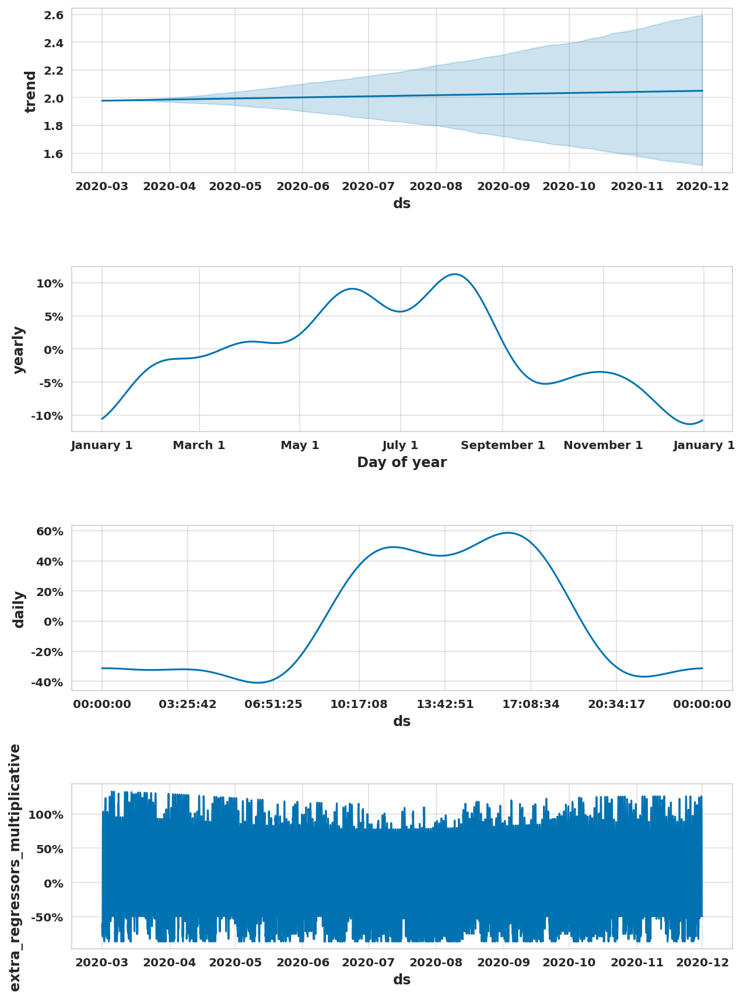

In [78]:
future_ = m.make_future_dataframe(periods=len(ds_val), freq='1H')
futures = future.merge(ds_val[["ds","Cloud", "RadiationDirect"]], on="ds")
forecast = m.predict(futures)
with sns.axes_style("whitegrid"):
    f = m.plot_components(forecast)


add regressor 결과 단순히 시점의 흐름에 의한 영향보다 구름량과 조사량으로 구한 회귀 모델의 영향이 더 큰 것을 확인할 수 있었습니다.<br>
이는 시간의 흐름과 조사량이 강한 상관관계를 갖고 있기 때문에 

In [79]:
df_val_result = ds_val.merge(forecast[["ds", "yhat"]], left_on="ds", right_on="ds")
rmse_base_add_reg_val = np.sqrt(mean_squared_error(y_true=inverse_transform(df_val_result["y"]), y_pred=inverse_transform(df_val_result["yhat"])))

period_test = pd.concat([ds_val, ds_test])
future_ = m.make_future_dataframe(periods=len(period_test), freq='1H')
futures = future.merge(period_test[["ds","Cloud", "RadiationDirect"]], on="ds")
forecast = m.predict(futures)

df_test_result = period_test.merge(forecast[["ds", "yhat"]], left_on="ds", right_on="ds")
mask_test = df_test_result["ds"].dt.date >= date_test_start
rmse_base_add_reg_test = np.sqrt(mean_squared_error(y_true=inverse_transform(df_test_result.loc[mask_test, "y"]), y_pred=inverse_transform(df_test_result.loc[mask_test,"yhat"])))

print(f'Baseline(All Values to mean training data y) Validation RMSE: {rmse_baseline_val:.3f}')
print(f'Baseline(All Values to mean training data y) Test RMSE: {rmse_baseline_test:.3f}')

print(f'Base Prophet Model Validation RMSE: {rmse_base_val:.3f}')
print(f'Base Prophet Model Test RMSE: {rmse_base_test:.3f}')

print(f'Base Add Regressor Model Validation RMSE: {rmse_base_add_reg_val:.3f}')
print(f'Base Add Regressor Model Test RMSE: {rmse_base_add_reg_test:.3f}')

<IPython.core.display.Javascript object>

Baseline(All Values to mean training data y) Validation RMSE: 119.808
Baseline(All Values to mean training data y) Test RMSE: 118.008
Base Prophet Model Validation RMSE: 69.102
Base Prophet Model Test RMSE: 45.022
Base Add Regressor Model Validation RMSE: 54.673
Base Add Regressor Model Test RMSE: 35.911


In [80]:
df_train.info()

<IPython.core.display.Javascript object>

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17543 entries, 0 to 17542
Data columns (total 22 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   DateTime         17543 non-null  datetime64[ns]
 1   Ulsan            17543 non-null  float64       
 2   Temperature      17543 non-null  float64       
 3   Humidity         17543 non-null  float64       
 4   Cloud            17543 non-null  float64       
 5   WindDirection    17543 non-null  float64       
 6   WindSpeed        17543 non-null  float64       
 7   SunUp            17543 non-null  bool          
 8   CivTwil          17543 non-null  bool          
 9   NauTwil          17543 non-null  bool          
 10  AstTwil          17543 non-null  bool          
 11  Azimuth          17543 non-null  float64       
 12  AltitudeDegree   17543 non-null  float64       
 13  RadiationDirect  17540 non-null  float64       
 14  Fog              17543 non-null  bool 

In [81]:
cols_xgb_category = ["WindDirection", "SunUp", "CivTwil", "AstTwil", "Month", "Day", "Weekday", "Fog"]
cols_xgb_drop = ["Date", "DateTime"]

<IPython.core.display.Javascript object>

In [82]:
tarenc = ce.TargetEncoder(cols=cols_xgb_category)
X_train = df_train.copy()
y_train = X_train[target]
X_train.drop(columns=[target]+cols_xgb_drop, inplace=True)
X_train = tarenc.fit_transform(X_train, y_train)
X_val = df_val.copy()
y_val = X_val[target]
X_val.drop(columns=[target]+cols_xgb_drop, inplace=True)
X_val = tarenc.transform(X_val)
X_test = df_test.copy()
y_test = X_test[target]
X_test.drop(columns=[target]+cols_xgb_drop, inplace=True)
X_test = tarenc.transform(X_test)

cols_rbst = X_train.columns.difference(cols_xgb_category)
rbst = RobustScaler()
X_train.loc[:, cols_rbst] = rbst.fit_transform(X_train[cols_rbst])
X_val.loc[:, cols_rbst] = rbst.fit_transform(X_val[cols_rbst])
X_test.loc[:, cols_rbst] = rbst.fit_transform(X_test[cols_rbst])
eval_set = [(X_train, y_train), 
            (X_val, y_val)]
xgbrg=XGBRegressor(subsample=0.7, random_state=123,
                   eval_set = eval_set,
                   early_stopping_rounds=20, verbosity=3)
xgbrg.fit(X_train, y_train)
y_pred = xgbrg.predict(X_val)
rmse_base_xgb_reg_val = np.sqrt(mean_squared_error(y_true=inverse_transform(y_val), y_pred=inverse_transform(y_pred)))
y_pred = xgbrg.predict(X_test)
rmse_base_xgb_reg_test = np.sqrt(mean_squared_error(y_true=inverse_transform(y_test), y_pred=inverse_transform(y_pred)))


print(f'Base XGB Model Validation RMSE: {rmse_base_xgb_reg_val:.3f}')
print(f'Base XGB Model Test RMSE: {rmse_base_xgb_reg_test:.3f}')

print(f'Baseline(All Values to mean training data y) Validation RMSE: {rmse_baseline_val:.3f}')
print(f'Baseline(All Values to mean training data y) Test RMSE: {rmse_baseline_test:.3f}')

print(f'Base Prophet Model Validation RMSE: {rmse_base_val:.3f}')
print(f'Base Prophet Model Test RMSE: {rmse_base_test:.3f}')

print(f'Base Add Regressor Model Validation RMSE: {rmse_base_add_reg_val:.3f}')
print(f'Base Add Regressor Model Test RMSE: {rmse_base_add_reg_test:.3f}')

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/category_encoders/utils.py:21: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



[08:00:43] ======== Monitor: Learner ========
[08:00:43] GetGradient: 0.10463s, 100 calls @ 1046us
[08:00:43] PredictRaw: 0.00424655s, 100 calls @ 42us
[08:00:43] UpdateOneIter: 1.72219s, 100 calls @ 17221us
[08:00:43] ======== Monitor: GBTree ========
[08:00:43] BoostNewTrees: 1.35011s, 100 calls @ 13501us
[08:00:43] CommitModel: 0.262382s, 100 calls @ 2623us
[08:00:43] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[08:00:43] INFO: /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[08:00:43] INFO: /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[08:00:43] INFO: /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_depth=3
[08:00:43] INFO: /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 14 extra nodes, 0 pruned nodes, max_de

참고 사항으로 log를 취하지 않은 target 값을 y로 주었을 때 훈련 결과는 아래와 같습니다.<br>
Base XGB Model Validation RMSE: 48.278<br>
Base XGB Model Test RMSE: 34.164<br>
Baseline(All Values to mean training data y) Validation RMSE: 103.768<br>
Baseline(All Values to mean training data y) Test RMSE: 102.514<br>
Base Prophet Model Validation RMSE: 68.286<br>
Base Prophet Model Test RMSE: 60.423<br>
Base Add Regressor Model Validation RMSE: 56.552<br>
Base Add Regressor Model Test RMSE: 52.032<br>

In [83]:
cols_rbst

<IPython.core.display.Javascript object>

Index(['AltitudeDegree', 'Azimuth', 'Cloud', 'Hour', 'Humidity', 'NauTwil',
       'PannelAzimuth', 'RadiationDirect', 'Temperature', 'WindSpeed', 'Year'],
      dtype='object')

In [84]:
cols_xgb_category = ["WindDirection", "SunUp", "CivTwil", "AstTwil", "Month", "Day", "Weekday", "Fog"]
cols_xgb_drop = ["Date", "DateTime"]
cols_rbst = ['AltitudeDegree', 'Azimuth', 'Cloud', 'Hour', 'Humidity', 'NauTwil', 'PannelAzimuth',
             'RadiationDirect', 'Temperature', 'WindSpeed', 'Year']

def build_model(trial):
    xgbrg_n_estimators = trial.suggest_int("xgbrg_n_estimators", 200, 2000)
    xgbrg_max_depth = trial.suggest_int("rf_max_depth", 2, 32, log=True)
    xgbrg_learning_rate = trial.suggest_float("xgbrg_learning_rate", 0.001, 0.5, log=True)
    tarenc_min_samples_leaf = trial.suggest_int("tarenc_min_samples_leaf", 1, 20)
    tarenc_smoothing = trial.suggest_float("tarenc_smoothing", 0.001, 100, log=True)

    regressor_obj = Pipeline(
    steps=[
        ("tarenc", ce.TargetEncoder(cols=cols_xgb_category, min_samples_leaf=tarenc_min_samples_leaf, smoothing=tarenc_smoothing)),
        ("coltrans", ColumnTransformer(
            transformers=[("rbst", RobustScaler(), cols_rbst)],
            remainder='passthrough')),
        ("xgbrg", XGBRegressor(n_estimators=xgbrg_n_estimators,
                    random_state=123,
                    n_jobs=-1,
                    max_depth=xgbrg_max_depth,
                    learning_rate=xgbrg_learning_rate,
                    eval_set=eval_set,
                    early_stopping_rounds=20,
                    verbosity=0,
                    objective='reg:squarederror'))
    ],
    verbose = 0)
    return regressor_obj
def objective(trial):
    n_train_iter = 5
    kfold = KFold(n_splits=n_train_iter, shuffle=False)
    score = [0]*n_train_iter
    for step, (train_index, test_index) in enumerate(kfold.split(X_train)):
        regressor_obj = build_model(trial)
        eval_set = [(X_train.iloc[train_index], y_train.iloc[train_index]), 
            (X_train.iloc[test_index], y_train.iloc[test_index])]
        regressor_obj.fit(X_train.iloc[train_index], y_train.iloc[train_index])
        y_pred = regressor_obj.predict(X_val)
        score[step] = mean_squared_error(y_pred, y_val)
        trial.report(score[step], step)

        # Handle pruning based on the intermediate value.
        if trial.should_prune():
            raise optuna.TrialPruned()
    return np.mean(score)

<IPython.core.display.Javascript object>

In [85]:
X_train = df_train.copy()
y_train = X_train[target]
X_train.drop(columns=[target]+cols_xgb_drop, inplace=True)
X_val = df_val.copy()
y_val = X_val[target]
X_val.drop(columns=[target]+cols_xgb_drop, inplace=True)
X_test = df_test.copy()
y_test = X_test[target]
X_test.drop(columns=[target]+cols_xgb_drop, inplace=True)

<IPython.core.display.Javascript object>

In [ ]:
# %%time
# study = optuna.create_study(sampler=optuna.samplers.TPESampler(), pruner=optuna.pruners.HyperbandPruner(), direction="minimize")
# study.optimize(objective, n_trials=120)


In [86]:
from joblib import dump, load
path ="/content/drive/MyDrive/Colab Notebooks/CodeStates/Section2/project/experiments.pkl"
# dump(study, path)
study = load(path)

<IPython.core.display.Javascript object>

In [87]:
model_xgb_opt = build_model(study.best_trial)
model_xgb_opt.fit(X_train, y_train)
y_pred = model_xgb_opt.predict(X_val)
rmse_model_xgb_opt_val = np.sqrt(mean_squared_error(y_true=inverse_transform(y_val), y_pred=inverse_transform(y_pred)))

y_pred = model_xgb_opt.predict(X_test)
rmse_model_xgb_opt_test = np.sqrt(mean_squared_error(y_true=inverse_transform(y_test), y_pred=inverse_transform(y_pred)))

print(f'Optimized Model Validation RMSE: {rmse_model_xgb_opt_val:.3f}')
print(f'Optimized Model Test RMSE: {rmse_model_xgb_opt_test:.3f}')

print(f'Base XGB Model Validation RMSE: {rmse_base_xgb_reg_val:.3f}')
print(f'Base XGB Model Test RMSE: {rmse_base_xgb_reg_test:.3f}')

print(f'Baseline(All Values to mean training data y) Validation RMSE: {rmse_baseline_val:.3f}')
print(f'Baseline(All Values to mean training data y) Test RMSE: {rmse_baseline_test:.3f}')

print(f'Base Prophet Model Validation RMSE: {rmse_base_val:.3f}')
print(f'Base Prophet Model Test RMSE: {rmse_base_test:.3f}')

print(f'Base Add Regressor Model Validation RMSE: {rmse_base_add_reg_val:.3f}')
print(f'Base Add Regressor Model Test RMSE: {rmse_base_add_reg_test:.3f}')

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/category_encoders/utils.py:21: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



Optimized Model Validation RMSE: 34.944
Optimized Model Test RMSE: 27.505
Base XGB Model Validation RMSE: 44.904
Base XGB Model Test RMSE: 55.342
Baseline(All Values to mean training data y) Validation RMSE: 119.808
Baseline(All Values to mean training data y) Test RMSE: 118.008
Base Prophet Model Validation RMSE: 69.102
Base Prophet Model Test RMSE: 45.022
Base Add Regressor Model Validation RMSE: 54.673
Base Add Regressor Model Test RMSE: 35.911


In [88]:
print(f'Ratio of Test RMSE between baseline and final model: {(rmse_baseline_test/rmse_model_xgb_opt_test):.2f}')

<IPython.core.display.Javascript object>

Ratio of Test RMSE between baseline and final model: 4.29


최종 모델의 성능은 단순히 RMSE로 비교했을 경우 4.29배 좋아진 것으로 보입니다.

In [115]:
test_ = X_test.copy()
temp = pred(model_xgb_opt, test_)
test_["y_pred"] = temp
test_.head()
# temp

<IPython.core.display.Javascript object>

,Temperature,Humidity,Cloud,WindDirection,WindSpeed,SunUp,CivTwil,NauTwil,AstTwil,Azimuth,AltitudeDegree,RadiationDirect,Fog,Year,Month,Day,Weekday,Hour,PannelAzimuth,y_pred
24143,1.9,46.0,0.0,320.0,1.9,False,False,False,False,349.0488,-76.0797,0.0,False,2020,12,1,1,0,149.0488,0.0
24144,1.5,49.0,0.0,340.0,2.3,False,False,False,False,41.0844,-72.6628,0.0,False,2020,12,1,1,1,158.9156,0.0
24145,0.9,53.0,0.0,340.0,3.1,False,False,False,False,67.3245,-62.6432,0.0,False,2020,12,1,1,2,132.6755,0.0
24146,0.6,53.0,0.0,340.0,2.5,False,False,False,False,81.1500,-50.8910,0.0,False,2020,12,1,1,3,118.8500,0.0
24147,0.4,54.0,0.0,320.0,3.1,False,False,False,False,90.7533,-38.7241,0.0,False,2020,12,1,1,4,109.2467,0.0


In [116]:
def build_df_visualize():
    train_ = X_train.copy()
    val_ = X_val.copy()
    test_ = X_test.copy()
    train_["y_pred"] = pred(model_xgb_opt, train_)
    val_["y_pred"] = pred(model_xgb_opt, val_)
    test_["y_pred"] = pred(model_xgb_opt, test_)
    df_visualize_ = pd.concat((train_,val_,test_))
    df_visualize_["Date"] = df_ulsan["Date"]
    df_visualize_["y_true"] = df_ulsan[target]
    df_visualize_ = pd.melt(df_visualize_, id_vars=["Date"], value_vars=["y_true", "y_pred"], var_name="predtrue", value_name='GeneratedPower')
    return df_visualize_

df_visualize = build_df_visualize()
df_visualize.tail()

<IPython.core.display.Javascript object>

,Date,predtrue,GeneratedPower
51257,2021-01-31,y_pred,0.0
51258,2021-01-31,y_pred,0.0
51259,2021-01-31,y_pred,0.0
51260,2021-01-31,y_pred,0.0
51261,2021-01-31,y_pred,0.0


<IPython.core.display.Javascript object>

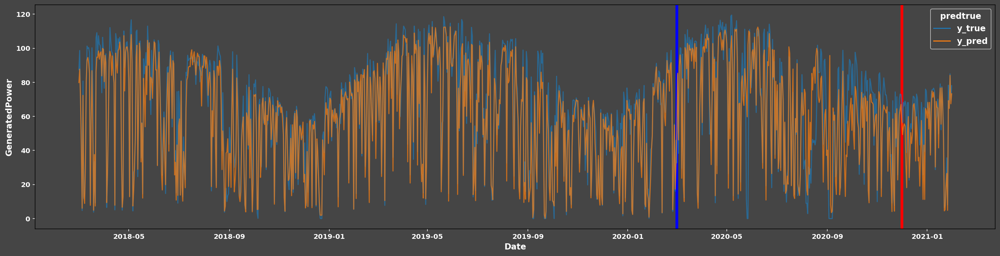

In [125]:
fig, ax = plt.subplots(figsize=(25,6))
sns.lineplot(data=df_visualize, x="Date", y="GeneratedPower", hue="predtrue", alpha=0.7, ax=ax, ci=None)
# .rolling()에서 min_periods보다 적은 수의 none-nan 값이 들어오면 해당 그룹을 nan처리해버린다. min_periods를 1로 주어 all-nan인 그룹을 없앴다.
# sns.lineplot(x=df_train["Date"], y=df_train[target].replace(0,np.nan).rolling(window=24*7,center=True, min_periods=1).mean(), alpha=0.8, color="white", linestyle='--', ax=ax)
ax.axvline(date_test_start, color='red', lw=4, zorder=-1)
ax.axvline(date_val_start, color='blue', lw=4, zorder=-1)
# plt.xlinm(date_val_start, df_visualize.loc[df_visualize.index[-1], "Date"])
plt.show()

target값에 0이 많아 생각과 다른 결과가 나오는 것 같습니다.<br>
우선 값이 0인지 아닌지를 분석하고, 0이 아닌 경우 값을 구하는 모델을 만들겠습니다.<br>

In [118]:
model_xgb_opt

<IPython.core.display.Javascript object>

Pipeline(memory=None,
         steps=[('tarenc',
                 TargetEncoder(cols=['WindDirection', 'SunUp', 'CivTwil',
                                     'AstTwil', 'Month', 'Day', 'Weekday',
                                     'Fog'],
                               drop_invariant=False, handle_missing='value',
                               handle_unknown='value', min_samples_leaf=7,
                               return_df=True, smoothing=55.294259869755464,
                               verbose=0)),
                ('coltrans',
                 ColumnTransformer(n_jobs=None, remainder='passthrough',
                                   sparse_th...
Name: Ulsan, Length: 6600, dtype: float64)],
                              gamma=0, importance_type='gain',
                              learning_rate=0.017702440823239757,
                              max_delta_step=0, max_depth=6, min_child_weight=1,
                              missing=None, n_estimators=347, n_jobs=-1,
      

# XAI
Permutation Importance와 SHAP을 통해 모델을 설명하겠습니다.

## Permutaion Importance

In [119]:
import eli5
from eli5.sklearn import PermutationImportance
def plot_permutation_importance(model, X, y):
    permuter = PermutationImportance(
        model, # model
        scoring='neg_mean_squared_error', # metric
        n_iter=5, # 다른 random seed를 사용하여 5번 반복
        random_state=2,
    )
    # 실제로 fit 의미보다는 스코어를 다시 계산하는 작업입니다
    permuter.fit(X, y)
    # Permutation Importance를 그래프로 플롯
    df_permutation = eli5.explain_weights_df(# eli5 에서 구한 permutation importance weight를 Pandas DataFrame 형태로 출력
        permuter, 
        top=None, # top n 지정 가능, None 일 경우 모든 특성 
        feature_names=X.columns.to_list(), # list 형식으로 넣어야 합니다
    ) # feature, weight, std 의 세 column으로 리턴된다.
    df_permutation.set_index("feature", inplace=True)
    fig = plt.figure(figsize=(10,6))
    ax = plt.subplot()
    df_permutation.sort_values("weight").plot.barh(xerr="std", title="Permutation Importance", ax=ax, legend=False)
    return fig

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning:

The sklearn.feature_selection.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.feature_selection. Anything that cannot be imported from sklearn.feature_selection is now part of the private API.



<IPython.core.display.Javascript object>

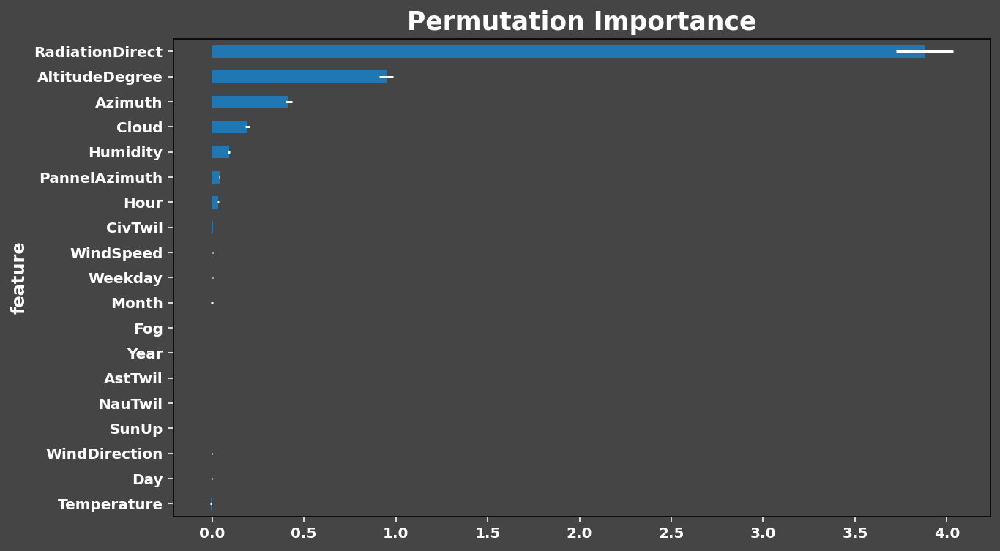

In [120]:
fig = plot_permutation_importance(model_xgb_opt, X_test, y_test)
plt.show()

`RadiatonDirect` 의 영향이 압도적인 것으로 보입니다.<br>
태양발전이 조사량의 영향을 받는 것은 당연하겠죠.<br>
시간에 대한 변수들의 영향력은 거의 없는 것으로 보이는데, 이는 단순조사량이 시간과 태양고도를 통해 계산되어 시간과 강한 상관관계를 갖고 있기 때문이라고 생각됩니다.<br>
야심차게 생성한 변수들의 영향은 생각보다 좋지 않았습니다.<br>
`PannelAzimuth`와 `Fog`는 0에 가까운 PI를 보여주었습니다.<br>
반면 처음부터 주어졌던 `Cloud`와 `Humidity`가 `pysolar`를 통해 생성한 세 변수를 제외하면 제일 큰 영향력을 주는 것으로 생각됩니다.

<IPython.core.display.Javascript object>

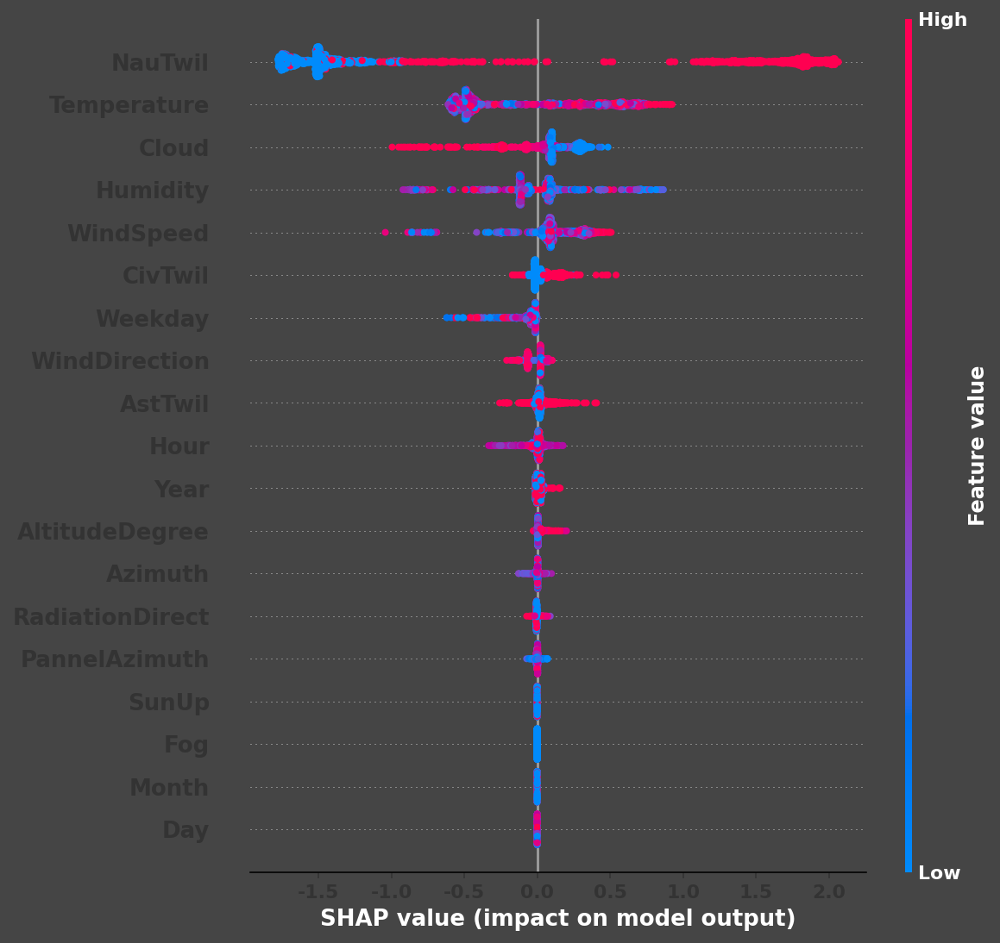

In [121]:
import shap
estimator = model_xgb_opt.named_steps["xgbrg"]
X_test_preprocessed = pd.DataFrame(model_xgb_opt.named_steps["tarenc"].transform(X_test), columns=X_test.columns)
X_test_preprocessed = pd.DataFrame(model_xgb_opt.named_steps["coltrans"].transform(X_test_preprocessed), columns=X_test.columns)
X_test_preprocessed = pd.DataFrame(X_test_preprocessed, columns=X_test.columns)
explainer = shap.TreeExplainer(estimator)
# explainer = shap.KernelExplainer(model = model_xgb_opt.named_steps["xgbrg"].predict, data = X_test_preprocessed.head(10), link = "identity")
shap.initjs()
# shap_values = explainer.shap_values(X_test_preprocessed.head(10))
shap_values = explainer.shap_values(X_test_preprocessed, inverse_transform(y_test))
# shap.summary_plot(shap_values, X_test.head(10))
shap.summary_plot(shap_values, X_test, )

### Draw SHAP plots ###

In [126]:
shap.initjs()
y_expect_filtered = inverse_transform(explainer.expected_value)
shap.force_plot(explainer.expected_value, shap_values, X_test)

<IPython.core.display.Javascript object>

## SHAP

SHAP 경향은 Permutation Importance와 조금 다른 경향을 보이는데<br>
해상박명 `NauTwil`이 결과 값을 0인지 아닌지로 결정짓고, 조사량 `RadiationDirect`이 0이 아닌 결과값을 결정하는 변수라고 생각됩니다.<br>
permutation importance 하면서 값을 랜덤으로 섞을 때 2 레이블로 나뉜 범주형 데이터가 잘못 들어갈 확률이 50% 라고 보면, 섞어도 크게 값이 바뀌지 않아서 pi가 낮게 측정된 것으로 생각됩니다.<br>
반면 연속형 변수는 같은 값이 들어갈 확률이 낮기 때문에 PI가 큰 것으로 나온 것이라고 생각합니다.<br>

결론적으로 `NauTwil` 값이 True냐 False냐에 따라 `RadiationDirect` 값이 0이냐 양의 실수를 갖는지 결정되고, 이 결과로 예측값이 결정된다고 볼 수 있습니다.<br>
두 변수의 상관도가 높기 때문에 발생한 현상으로 생각되고 다음 모델 생성시 `NauTwil`을 빼고 모델링해볼 가치가 있겠습니다.

# 결론
이번 프로젝트는 `동서발전 태양광 발전량 예측 AI 경진대회`를 작은 세부 프로젝트로 나눈 것입니다.<br>
해당 경진대회를 수행하는 로드맵을 다음과 같이 그렸습니다.
1. 한 발전소에 대해 특정 날짜의 날씨와 기타 수집한 정보가 주어졌을 때 발전량을 예측하기
2. 특정 날짜의 날씨를 일기예보와 기타 수집한 정보로 예측해 1.의 모델에 데이터로 투입하기
3. 비슷한 파이프라인을 4개의 발전소에 대해 생성하고 최종 모델을 구축하기.

그 중 제 섹션2 프로젝트는 1. 에 해당하는 내용이었습니다.<br>

주어진 발전소 위치정보, 날씨정보, 일기예보 내용 이외에 일몰,일출시각, 태양고도, 방위각, 단순태양조사량을 수집해 모델을 만들었습니다.<br>
큰 틀에서는 주어진 날씨 정보보다 태양운행에 대한 정보가 더 중요하게 작용한다는 것을 알 수 있습니다.<br>
다만 fine tuning을 위해선 날씨 정보, 그 중에서도 구름량과 습도를 활용할 필요성이 보이고, 따라서 보다 정확한 발전량 `예측`을 위해선 2.단계의 일기예보 모델링이 중요하다고 생각됩니다.<br>